# 0) Import the csv file and Define constants and groups:

## 0.1) INSERT the path of the files + the filename 

In [98]:
import pandas as pd
import numpy as np
import math

import matplotlib.pyplot as plt
import seaborn as sns #for nice graphs
sns.set()

from tqdm import tqdm_notebook #for progress bars

#Will display a progress bar when using progress_map() or progress_apply()
# Create and register a new `tqdm` instance with `pandas`
# tqdm_notebook().pandas()

##FILL path and filename:
my_path = "F:/LMT/Magel2/Analyses, Graphs, Results/All files_5 first hours_20min bins/"
filename = "Magel2_All-files-combined_5-hours_20min-bins.csv"


df = pd.read_csv(my_path + filename) #Load the combined file of all the data from LMT recordings
df = df.drop(columns=["Filename"]) #Remove Filename Column

df

,Date,Cage,Session,Bin,start_frame,stop_frame,name,idA,idB,idC,...,GenoB,GenoC,GenoD,totalLength,meanLength,medianLength,numberOfEvents,stdLength,CI95_low,CI95_up
0,190812,Cage3,Hab1,0,2000,38000,Move,1,NaN,NaN,...,NaN,NaN,NaN,10279,8.688926,5.0,1183,10.699362,8.079219,9.298634
1,190812,Cage3,Hab1,0,2000,38000,Move,3,NaN,NaN,...,NaN,NaN,NaN,10589,8.686628,5.0,1219,10.823981,8.078996,9.294261
2,190812,Cage3,Hab1,0,2000,38000,Move,2,NaN,NaN,...,NaN,NaN,NaN,12577,10.898614,7.0,1154,12.105943,10.200137,11.597090
3,190812,Cage3,Hab1,0,2000,38000,Move isolated,1,NaN,NaN,...,NaN,NaN,NaN,7647,8.809908,5.0,868,11.096541,8.071691,9.548124
4,190812,Cage3,Hab1,0,2000,38000,Move isolated,3,NaN,NaN,...,NaN,NaN,NaN,7790,9.251781,5.0,842,11.081464,8.503272,10.000291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183280,200601,Cage14,LMT3,14,506000,542000,Nest4,1,3.0,2.0,...,KO_OXT,WT_NaCl,KO_OXT,0,NaN,NaN,0,NaN,NaN,NaN
183281,200601,Cage14,LMT3,14,506000,542000,Nest4,1,4.0,3.0,...,KO_OXT,KO_OXT,WT_NaCl,0,NaN,NaN,0,NaN,NaN,NaN
183282,200601,Cage14,LMT3,14,506000,542000,Nest4,1,4.0,2.0,...,KO_OXT,WT_NaCl,KO_OXT,0,NaN,NaN,0,NaN,NaN,NaN
183283,200601,Cage14,LMT3,14,506000,542000,Nest4,1,2.0,3.0,...,WT_NaCl,KO_OXT,KO_OXT,0,NaN,NaN,0,NaN,NaN,NaN


## 0.2) Define the behaviors/constants:

In [3]:
df.name.unique() #Show the name of the different behaviors

array(['Move', 'Move isolated', 'Rearing', 'Rear isolated',
       'Stop isolated', 'WallJump', 'SAP', 'Huddling', 'WaterPoint',
       'Contact', 'Oral-oral Contact', 'Oral-genital Contact',
       'Side by side Contact', 'Side by side Contact, opposite way',
       'Social approach', 'Social escape', 'Approach contact',
       'Approach rear', 'Break contact', 'Get away',
       'FollowZone Isolated', 'Train2', 'Group2', 'Group3', 'Group4',
       'Nest4'], dtype=object)

In [99]:
behaviorsOne = ['Move','Move isolated','Rear isolated','Stop isolated', 
                'WallJump', 'SAP', 'Huddling', 'Rearing', 'WaterPoint']
behaviorsTwo = ['Contact', 'Oral-oral Contact', 'Oral-genital Contact','Side by side Contact', 
                'Side by side Contact, opposite way','Social approach', 'Social escape', 'Approach contact',
                'Approach rear', 'Break contact', 'Get away','FollowZone Isolated', 'Train2', 'Group2']
behaviorsThree = ['Group3', 'Group3 Make', 'Group3 Break', 'Train3', 'Nest3']


### Define a function to attribute a color according to genotypes:

In [145]:
df.GenoA.unique()

array(['Hetero_NaCl', 'KO_NaCl', 'KO_OXT', 'WT_NaCl', 'Hetero_OXT',
       'WT_OXT'], dtype=object)

In [140]:
def colorChoice(genotype):
    if "WT" in genotype:
        color = "b" if ("OXT" in genotype) else "lightblue"
    if "KO" in genotype:
        color = "r" if ("OXT" in genotype) else "plum"
    if "Hetero" in genotype:
        color = "g" if ("OXT" in genotype) else "lightgrey"
    return color

# 1) Behavior with ONLY one Animal:

## 1.1) Create a dataframe "dfOne" with the behaviors involving only one animal!


In [100]:
#Create a dataframe "dfOne" with the behaviors involving only one animal!
# behaviorsOne = ['Move','Move isolated','Rear isolated','Stop isolated', 'WallJump', 'SAP', 'Huddling', 'Rearing', 'WaterPoint']
dfOne = df[df['name'].isin(behaviorsOne)]
dfOne = dfOne.drop(columns=["idB", "idC", "idD","GenoB","GenoC","GenoD",'RFidB','RFidC','RFidD'])
dfOne


,Date,Cage,Session,Bin,start_frame,stop_frame,name,idA,RFidA,GenoA,totalLength,meanLength,medianLength,numberOfEvents,stdLength,CI95_low,CI95_up
0,190812,Cage3,Hab1,0,2000,38000,Move,1,4809322,Hetero_NaCl,10279,8.688926,5.0,1183,10.699362,8.079219,9.298634
1,190812,Cage3,Hab1,0,2000,38000,Move,3,4809319,Hetero_NaCl,10589,8.686628,5.0,1219,10.823981,8.078996,9.294261
2,190812,Cage3,Hab1,0,2000,38000,Move,2,4809320,KO_NaCl,12577,10.898614,7.0,1154,12.105943,10.200137,11.597090
3,190812,Cage3,Hab1,0,2000,38000,Move isolated,1,4809322,Hetero_NaCl,7647,8.809908,5.0,868,11.096541,8.071691,9.548124
4,190812,Cage3,Hab1,0,2000,38000,Move isolated,3,4809319,Hetero_NaCl,7790,9.251781,5.0,842,11.081464,8.503272,10.000291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183040,200601,Cage14,LMT3,14,506000,542000,Huddling,1,4724347,WT_OXT,0,NaN,NaN,0,NaN,NaN,NaN
183041,200601,Cage14,LMT3,14,506000,542000,WaterPoint,3,4724424,KO_OXT,0,NaN,NaN,0,NaN,NaN,NaN
183042,200601,Cage14,LMT3,14,506000,542000,WaterPoint,4,4612353,KO_OXT,0,NaN,NaN,0,NaN,NaN,NaN
183043,200601,Cage14,LMT3,14,506000,542000,WaterPoint,2,4612312,WT_NaCl,0,NaN,NaN,0,NaN,NaN,NaN


In [101]:
#Adds the Cumulative length of totalLength and meanLength of the 'dfOne' Dataframe 

session = dfOne.Session.unique()
behaviors = dfOne.name.unique()
rfidAs = dfOne.RFidA.unique()

with tqdm_notebook(total=session.shape[0]*behaviors.shape[0]*rfidAs.shape[0]) as t:
    for sess in session:
        for beh in behaviors:
            for rfid in rfidAs:
                cond = (dfOne.Session==sess) & (dfOne.name==beh) & (dfOne.RFidA==rfid)
                dfOne.loc[cond, "totalLength_cum"] = dfOne.loc[cond, "totalLength"].cumsum()
                dfOne.loc[cond, "meanLength_cum"] = dfOne.loc[cond, "meanLength"].cumsum()
                t.update()
dfOne

,Date,Cage,Session,Bin,start_frame,stop_frame,name,idA,RFidA,GenoA,totalLength,meanLength,medianLength,numberOfEvents,stdLength,CI95_low,CI95_up,totalLength_cum,meanLength_cum
0,190812,Cage3,Hab1,0,2000,38000,Move,1,4809322,Hetero_NaCl,10279,8.688926,5.0,1183,10.699362,8.079219,9.298634,10279.0,8.688926
1,190812,Cage3,Hab1,0,2000,38000,Move,3,4809319,Hetero_NaCl,10589,8.686628,5.0,1219,10.823981,8.078996,9.294261,10589.0,8.686628
2,190812,Cage3,Hab1,0,2000,38000,Move,2,4809320,KO_NaCl,12577,10.898614,7.0,1154,12.105943,10.200137,11.597090,12577.0,10.898614
3,190812,Cage3,Hab1,0,2000,38000,Move isolated,1,4809322,Hetero_NaCl,7647,8.809908,5.0,868,11.096541,8.071691,9.548124,7647.0,8.809908
4,190812,Cage3,Hab1,0,2000,38000,Move isolated,3,4809319,Hetero_NaCl,7790,9.251781,5.0,842,11.081464,8.503272,10.000291,7790.0,9.251781
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183040,200601,Cage14,LMT3,14,506000,542000,Huddling,1,4724347,WT_OXT,0,NaN,NaN,0,NaN,NaN,NaN,0.0,NaN
183041,200601,Cage14,LMT3,14,506000,542000,WaterPoint,3,4724424,KO_OXT,0,NaN,NaN,0,NaN,NaN,NaN,0.0,NaN
183042,200601,Cage14,LMT3,14,506000,542000,WaterPoint,4,4612353,KO_OXT,0,NaN,NaN,0,NaN,NaN,NaN,0.0,NaN
183043,200601,Cage14,LMT3,14,506000,542000,WaterPoint,2,4612312,WT_NaCl,0,NaN,NaN,0,NaN,NaN,NaN,0.0,NaN


### Check if the cumulative sum is properly computed with one example: 

In [102]:
#Sort the data to CONTROL if the CUMULATIVE sum is properly computed:
dfOne.sort_values(['name','GenoA','Bin','RFidA'])
condition = (dfOne['Session']=='LMT1')&(dfOne['name']=='Move')&(dfOne['RFidA']==4724325)
# dfOne[condition][['Date','Cage','Session','Bin', 'RFidA', 'totalLength', 'meanLength', 'totalLength_cum', 'meanLength_cum']]
dfOne[condition]

,Date,Cage,Session,Bin,start_frame,stop_frame,name,idA,RFidA,GenoA,totalLength,meanLength,medianLength,numberOfEvents,stdLength,CI95_low,CI95_up,totalLength_cum,meanLength_cum
63227,190930,Cage9,LMT1,0,2000,38000,Move,3,4724325,KO_NaCl,17722,11.925976,7.0,1486,14.122228,11.207934,12.644018,17722.0,11.925976
63503,190930,Cage9,LMT1,1,38000,74000,Move,3,4724325,KO_NaCl,14115,11.105429,6.0,1271,14.144747,10.327789,11.883069,31837.0,23.031405
63779,190930,Cage9,LMT1,2,74000,110000,Move,3,4724325,KO_NaCl,12291,10.354676,6.0,1187,12.855810,9.623317,11.086034,44128.0,33.386080
64055,190930,Cage9,LMT1,3,110000,146000,Move,3,4724325,KO_NaCl,10075,8.319571,5.0,1211,10.667845,7.718728,8.920413,54203.0,41.705651
64331,190930,Cage9,LMT1,4,146000,182000,Move,3,4724325,KO_NaCl,9917,8.042985,4.0,1233,11.069738,7.425094,8.660876,64120.0,49.748635
64607,190930,Cage9,LMT1,5,182000,218000,Move,3,4724325,KO_NaCl,7849,8.625275,5.0,910,11.578552,7.872977,9.377572,71969.0,58.373910
64883,190930,Cage9,LMT1,6,218000,254000,Move,3,4724325,KO_NaCl,5947,6.765643,4.0,879,9.475537,6.139223,7.392063,77916.0,65.139553
65159,190930,Cage9,LMT1,7,254000,290000,Move,3,4724325,KO_NaCl,5540,5.874867,4.0,943,7.647818,5.386735,6.363000,83456.0,71.014420
65435,190930,Cage9,LMT1,8,290000,326000,Move,3,4724325,KO_NaCl,4929,4.551247,2.0,1083,7.742623,4.090110,5.012383,88385.0,75.565667
65711,190930,Cage9,LMT1,9,326000,362000,Move,3,4724325,KO_NaCl,5322,7.077128,4.0,752,10.005685,6.361983,7.792272,93707.0,82.642795


In [ ]:
#GroupBy Example:
#Group data and select a sub-group
# grouped = dfOne.groupby(['name','GenoA','bin'])
# grouped.get_group(('Move','KO_OXT',0))

In [18]:
#In one command (+DATA SORTED):
dfOne.groupby(['name','GenoA'], as_index=False).get_group(('Move','KO_OXT')).sort_values(['RFidA','Bin']) 
# With .sort_values(['RFidA','bin']) = Sorts first by BIN then by RFID (each RFID is in bin order)
# With .groupby('bin'): 'bin' becomes index

,Date,Cage,Session,Bin,start_frame,stop_frame,name,idA,RFidA,GenoA,totalLength,meanLength,medianLength,numberOfEvents,stdLength,CI95_low,CI95_up,totalLength_cum,meanLength_cum
92207,191020,Cage12,LMT1,0,2000,38000,Move,2,4612259,KO_OXT,14975,11.125557,6.0,1346,13.834400,10.386473,11.864641,14975.0,11.125557
141887,191125,Cage12,LMT2,0,2000,38000,Move,1,4612259,KO_OXT,14052,10.145848,6.0,1385,12.947061,9.463977,10.827720,14052.0,10.145848
175007,191220,Cage12,LMT3,0,2000,38000,Move,1,4612259,KO_OXT,15456,10.141732,6.0,1524,14.286885,9.424432,10.859033,15456.0,10.141732
92483,191020,Cage12,LMT1,1,38000,74000,Move,2,4612259,KO_OXT,12613,10.204693,6.0,1236,12.003883,9.535473,10.873912,27588.0,21.330250
142163,191125,Cage12,LMT2,1,38000,74000,Move,1,4612259,KO_OXT,11821,9.713229,6.0,1217,12.920874,8.987286,10.439173,25873.0,19.859078
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104075,191024,Cage1,LMT3,13,470000,506000,Move,3,4809613,KO_OXT,1594,4.403315,2.0,362,7.734388,3.606554,5.200075,58148.0,70.958837
5621,190813,Cage1,Hab1,14,506000,542000,Move,3,4809613,KO_OXT,3993,3.594059,2.0,1111,5.333514,3.280433,3.907686,79731.0,99.541817
15656,190823,Cage1,LMT1,14,506000,542000,Move,4,4809613,KO_OXT,0,NaN,NaN,0,NaN,NaN,NaN,86615.0,NaN
50531,190922,Cage1,LMT2,14,506000,542000,Move,3,4809613,KO_OXT,0,NaN,NaN,0,NaN,NaN,NaN,60601.0,NaN


In [20]:
#Show the first item of the grouped data
dfOne.groupby(['name','GenoA','Bin'], as_index=False).first() 

,name,GenoA,Bin,Date,Cage,Session,start_frame,stop_frame,idA,RFidA,totalLength,meanLength,medianLength,numberOfEvents,stdLength,CI95_low,CI95_up,totalLength_cum,meanLength_cum
0,Huddling,Hetero_NaCl,0,190812,Cage3,Hab1,2000,38000,1,4809322,0,1.620253,1.0,0,1.334108,1.326059,1.914447,0.0,1.620253
1,Huddling,Hetero_NaCl,1,190812,Cage3,Hab1,38000,74000,1,4809322,0,1.458101,1.0,0,1.247200,1.275389,1.640812,0.0,3.078354
2,Huddling,Hetero_NaCl,2,190812,Cage3,Hab1,74000,110000,1,4809322,0,1.744076,1.0,0,2.786375,1.368105,2.120047,0.0,4.822430
3,Huddling,Hetero_NaCl,3,190812,Cage3,Hab1,110000,146000,1,4809322,0,1.994186,1.0,0,2.707649,1.708052,2.280320,0.0,6.816616
4,Huddling,Hetero_NaCl,4,190812,Cage3,Hab1,146000,182000,1,4809322,0,2.020661,1.0,0,2.444336,1.802893,2.238429,0.0,8.837277
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
805,WaterPoint,WT_OXT,10,190827,Cage4,Hab1,362000,398000,4,4809290,0,NaN,NaN,0,NaN,NaN,NaN,0.0,NaN
806,WaterPoint,WT_OXT,11,190827,Cage4,Hab1,398000,434000,4,4809290,0,NaN,NaN,0,NaN,NaN,NaN,0.0,NaN
807,WaterPoint,WT_OXT,12,190827,Cage4,Hab1,434000,470000,4,4809290,0,NaN,NaN,0,NaN,NaN,NaN,0.0,NaN
808,WaterPoint,WT_OXT,13,190827,Cage4,Hab1,470000,506000,4,4809290,0,NaN,NaN,0,NaN,NaN,NaN,0.0,NaN


In [90]:
#groupby Name and GenoA, then Select subgroup, then group by 'bin' and use that to plot averages!
example = dfOne.groupby(['Session','name','GenoA'], as_index=False).get_group(('LMT1','Move','WT_NaCl')).groupby(['Bin'], as_index=False)['totalLength'].mean()
example

,Bin,totalLength
0,0,15858.625
1,1,12549.500
2,2,10685.000
3,3,9940.500
4,4,8868.125
5,5,8647.125
6,6,7502.750
7,7,5891.125
8,8,5188.625
9,9,4718.625


In [ ]:
##Plotting examples:
# use:
plt.plot(example.Bin, example.totalLength)
# OR:
example.plot(x='Bin', y='totalLength')

##  1.2) Plot the graphs for behaviors with only ONE animal:

In [152]:
#Plot the data OF INDIVIDUALS MICE for the Different Genotypes using the groupby dataframe:

# sessions = dfOne['Session'].unique() #use ALL the sessions in dataframe
sessions = ['LMT1'] # OR use specific session

behaviors = dfOne['name'].unique()

groups = dfOne['GenoA'].unique() #use ALL the groups in dataframe
groups = ["WT_NaCl", "WT_OXT", "KO_OXT", "KO_NaCl"] #Does not plot Hetero mice

for sess in sessions:
    print(sess)
    for beh in behaviors:
        print(beh)
        fig, ax = plt.subplots(nrows=2,ncols=6,sharey='row',figsize=(23,10)) #Create a figure with 2 rows and 6 columns of subplots
        fig.suptitle(f"{beh}:" , fontsize=16)

        count = 0
        for geno in dfOne['GenoA'].unique():
    #         print(geno)
            cond = (dfOne['Session']==sess) & (dfOne['name']==beh) & (dfOne['GenoA']==geno)
        
            color = colorChoice(geno)
            for rf in dfOne[cond]['RFidA'].unique():
                df_grouped = dfOne.groupby(['Session','name','GenoA'], as_index=False).get_group((sess,beh,geno)) #Define the Groupby dataframe

                ### Calculate the x, y, and SEM of the average trace of TotalLength
                x = df_grouped.groupby('Bin')['Bin'].mean()
                y = df_grouped.groupby('Bin')['totalLength'].mean()
                std = df_grouped.groupby('Bin')['totalLength'].std()
                sem = std/math.sqrt(len(std))

                df_grouped[df_grouped['RFidA']==rf].plot(x='Bin', y='totalLength', label=rf, ax=ax[0,count]) # PLOT Total Length
                ax[0,count].errorbar(x,y,sem, linestyle='--', marker='o', color = color) #Plot The Average
                ax[0,count].fill_between(x, y-sem, y+sem, color=color, alpha=0.1) #Plot the SEM of the average

                ### Calculate the x, y, and SEM of the average trace of CUMULATIVE TotalLength
                x_cum = df_grouped.groupby('Bin')['Bin'].mean()
                y_cum = df_grouped.groupby('Bin')['totalLength_cum'].mean()
                std_cum = df_grouped.groupby('Bin')['totalLength_cum'].std()
                sem_cum = std_cum/math.sqrt(len(std_cum))

                df_grouped[df_grouped['RFidA']==rf].plot(x='Bin', y='totalLength_cum', label=rf, ax=ax[1,count]) # Plot Cumulative Length
                ax[1,count].errorbar(x_cum,y_cum,sem_cum, linestyle='--', 
                                     marker='o', color = color) #Plot The Average (previous color = 'red')
                ax[1,count].fill_between(x_cum, y_cum-sem_cum, y_cum+sem_cum, 
                                         color=color, alpha=0.1) #Plot the SEM of the average (previous color = 'lightcoral')

                ax[0,count].set_xlabel('20min time Bins')
                ax[0,count].set_title(geno)
                ax[1,count].set_xlabel('20min time Bins')
                
#             plt.xticks(np.arange(0,14,step=1)) #x-axis with 0 to 14 Bins
            ax[0,0].set_ylabel('Total length of Event') #Y-axis label on left graph
            ax[1,0].set_ylabel('CUMULATIVE length of Event')

            count += 1

#         plt.show() #Display the figure in the notebook
        fig.savefig(my_path + f"Individuals Graphs/{sess}_20min-Bins_{beh}_beh-One_indiv.png", dpi=100); # SAVE A .PNG FIGURE
        plt.close()

LMT1
Move
Move isolated
Rearing
Rear isolated
Stop isolated
WallJump
SAP
Huddling
WaterPoint


## 1.3) Plot the behaviors by genotypes:

Hab1
  Move
  Move isolated
  Rearing
  Rear isolated
  Stop isolated
  WallJump
  SAP
  Huddling
  WaterPoint
LMT1
  Move
  Move isolated
  Rearing
  Rear isolated
  Stop isolated
  WallJump
  SAP
  Huddling
  WaterPoint
LMT2
  Move
  Move isolated
  Rearing


C:\Users\Damien\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


  Rear isolated
  Stop isolated
  WallJump
  SAP
  Huddling
  WaterPoint
LMT3
  Move
  Move isolated
  Rearing
  Rear isolated
  Stop isolated
  WallJump
  SAP
  Huddling
  WaterPoint


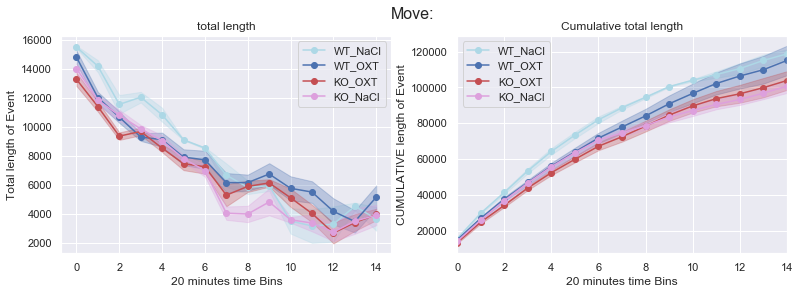

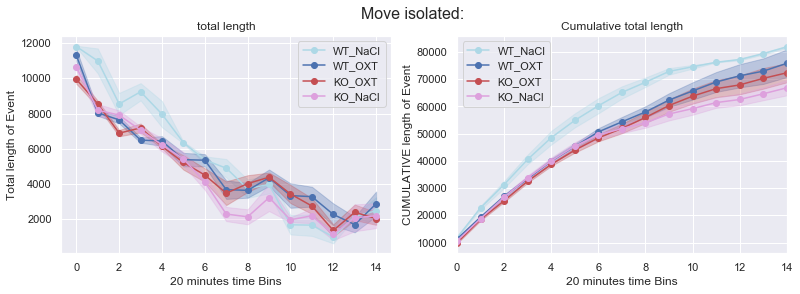

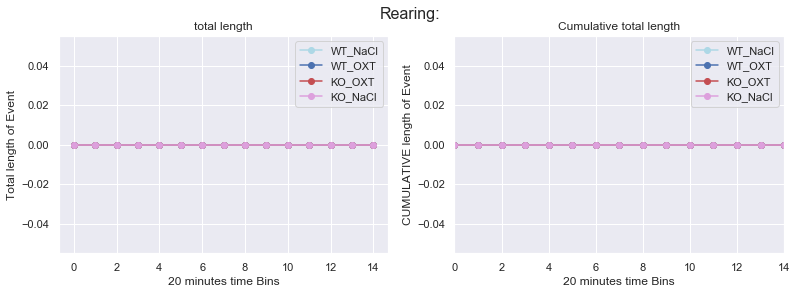

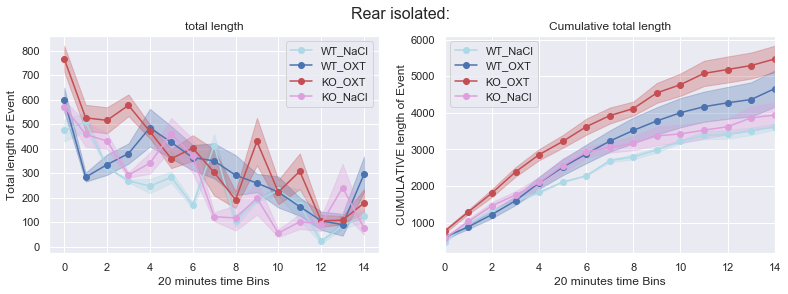

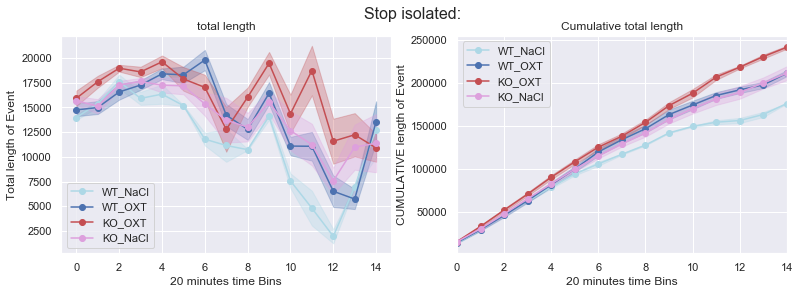

...

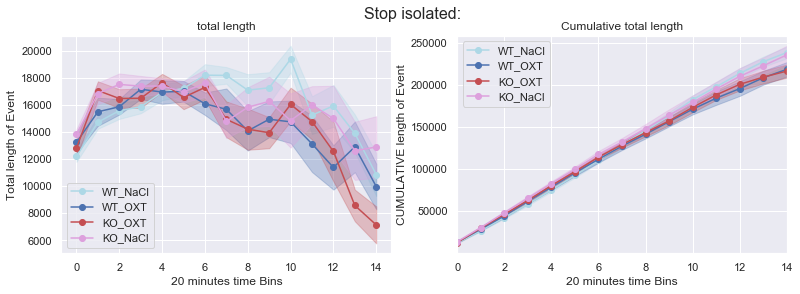

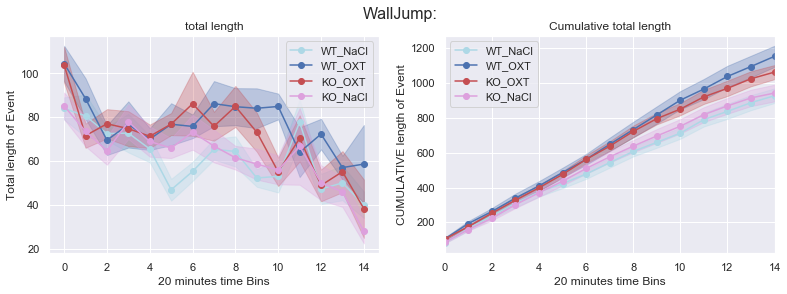

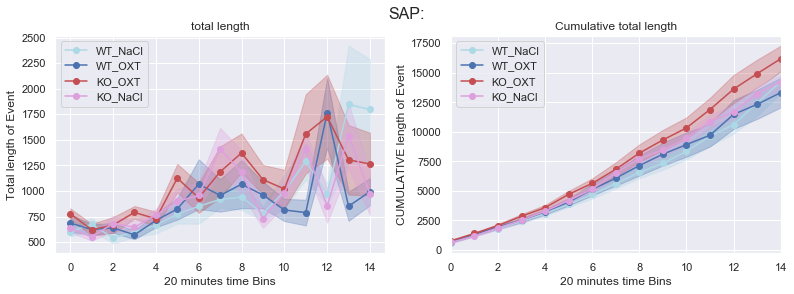

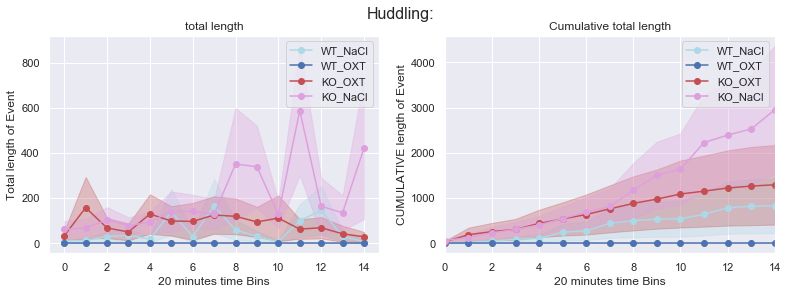

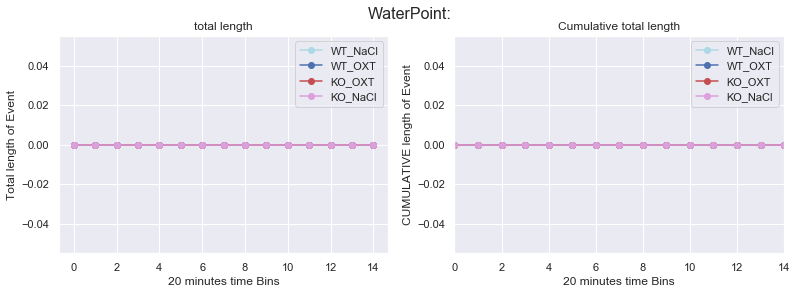

In [147]:
#Plot the data of GROUPED genotypes using the DOUBLE groupby dataframe:
#dfOne.groupby(['name','GenoA'], as_index=False).get_group(('Move','KO_OXT')).groupby(['Bin'], as_index=False)['totalLength'].mean()

sessions = dfOne['Session'].unique() # Define the different sessions to loop on
# sessions = ['LMT1'] # Or specify specific session to run

behaviors = dfOne['name'].unique() # Define the different behaviors to loop on

# genotypes = dfOne['GenoA'].unique() # Define the different genotypes to loop on
genotypes = ["WT_NaCl", "WT_OXT", "KO_OXT", "KO_NaCl"] #Does not plot Hetero mice

## Defines the dfGrouped with Session, Behaviors and Genotypes:
dfGrouped = dfOne.groupby(['Session','name','GenoA'], as_index=False)

for sess in sessions:
    print(sess)
    for beh in behaviors:
        print(" ",beh)
        fig, ax = plt.subplots(nrows=1,ncols=2,figsize=(13,4)) #Create a figure with 1 row and 2 columns of subplots
        fig.suptitle(f"{beh}:" , fontsize=16)

        for geno in genotypes:
    #         print(geno)
            color = colorChoice(geno) #colorChoice function defined before
            
            ##Define the dfGrouped averaged by Bins:
            dfGrouped_Bin = dfGrouped.get_group((sess,beh,geno)).groupby('Bin')
            
            ##Compute the average and plots:
            x = dfGrouped_Bin['Bin'].mean() #x-axis Bins

            df_totalLen = dfGrouped_Bin['totalLength'].mean()
            df_totalLen_std = dfGrouped_Bin['totalLength'].std()
            df_totalLen_sem = df_totalLen_std / math.sqrt(len(df_totalLen_std))

            ax[0].plot(df_totalLen.index, df_totalLen, color=color, marker='o', label=geno) #plot totalLength
    #         ax[0].errorbar(x,df_totalLen,df_totalLen_sem, marker='o', color = color) #Plot The Average
            ax[0].fill_between(x,df_totalLen-df_totalLen_sem, df_totalLen+df_totalLen_sem, color=color, alpha=0.3) #Plot the SEM of the average
            ax[0].legend()
            ax[0].set_xlabel('20 minutes time Bins')
            ax[0].set_title("total length")
            ax[0].set_ylabel('Total length of Event') #Y-axis label on left graph

            ##Compute CUMULATIVE sums and plots:
            df_totalLen_cum = dfGrouped_Bin['totalLength_cum'].mean()
            df_totalLen_cum_std = dfGrouped_Bin['totalLength_cum'].std()
            df_totalLen_cum_sem = df_totalLen_cum_std / math.sqrt(len(df_totalLen_cum_std))

            df_totalLen_cum.plot(x='Bin', y='totalLength_cum', color=color, marker='o', label=geno, ax=ax[1]) #plot Cumulative Length
    #         ax[1].errorbar(x,df_totalLen_cum,df_totalLen_cum_sem, marker='o', color = color) #Plot The Average
            ax[1].fill_between(x,df_totalLen_cum-df_totalLen_cum_sem, df_totalLen_cum+df_totalLen_cum_sem, color=color, alpha=0.3) #Plot the SEM of the average
            ax[1].set_xlabel('20 minutes time Bins')
            ax[1].legend()
            ax[1].set_title("Cumulative total length")
            ax[1].set_ylabel('CUMULATIVE length of Event')

#         plt.show() #Display the figure
    #     fig.savefig(f"{sess}_20min-Bins_{beh}_Groups.png", dpi=100) # SAVE A .PNG FIGURE
        fig.savefig(my_path + f'Groups Graphs/{sess}_20min-Bins_{beh}_beh-One_Groups_No-Hetero.png')
        plt.close()

#### Plot for individual data... (not so usefull ? Looks bad!!)

In [ ]:
#Plot the data OF INDIVIDUALS MICE for the Different Genotypes using the groupby dataframe:
df_temp = dfOne.groupby(['name','GenoA'])

def colorChoice(geno):
    if "WT" in geno:
        color = "limegreen" if ("OXT" in geno) else "darkgreen"
    if "KO" in geno:
        color = "salmon" if ("OXT" in geno) else "red"
    if "Hetero" in geno:
        color = "silver" if ("OXT" in geno) else "grey"
    return color

for beh in dfOne['name'].unique():
#     print(beh)
    fig, ax = plt.subplots(nrows=1,ncols=2,figsize=(14,5)) #Create a figure with 1 rows and 2 columns of subplots
    fig.suptitle(f"{beh}:" , fontsize=14)
    
    for geno in dfOne['GenoA'].unique():
#         print(geno)
        color = colorChoice(geno)
        df_temp.get_group((beh,geno)).plot(kind = 'scatter', x='bin', y='totalLength', 
                                           label=geno, c=color, ax=ax[0])
        
        df_temp.get_group((beh,geno)).plot(kind = 'scatter',x='bin', y='totalLength_cum', 
                                           label=geno, c=color, ax=ax[1])
        
        ax[0].set_xticks(np.arange(0,5,step=1))
        ax[1].set_xticks(np.arange(0,5,step=1))
        
        ax[0].set_xlabel('1h time bins')
        ax[1].set_xlabel('1h time bins')
        
        ax[0].set_ylabel('Total length of Event') #Y-axis labels
        ax[1].set_ylabel('CUMULATIVE length of Event')

    plt.show() #Display the figure
    
    # SAVE A .PNG FIGURE:
    fig.savefig(f"Hab_1h-bins_{beh}_Grouped.png", dpi=100) 

# 2) Behaviors with Two animals:

## 2.1) Define the dfTwo and calculate the cumulative sum of behaviors: 

In [63]:
df.name.unique()

array(['Move', 'Move isolated', 'Rearing', 'Rear isolated',
       'Stop isolated', 'WallJump', 'SAP', 'Huddling', 'WaterPoint',
       'Contact', 'Oral-oral Contact', 'Oral-genital Contact',
       'Side by side Contact', 'Side by side Contact, opposite way',
       'Social approach', 'Social escape', 'Approach contact',
       'Approach rear', 'Break contact', 'Get away',
       'FollowZone Isolated', 'Train2', 'Group2', 'Group3', 'Group4',
       'Nest4'], dtype=object)

In [160]:
#Create a dataframe "dfTwo" with the behaviors involving TWO animals!
# behaviorsTwo = ['Contact', 'Oral-oral Contact', 'Oral-genital Contact','Side by side Contact', 
#                 'Side by side Contact, opposite way','Social approach', 'Social escape', 'Approach contact',
#                 'Approach rear', 'Break contact', 'Get away','FollowZone Isolated', 'Train2', 'Group2']
dfTwo = df[df['name'].isin(behaviorsTwo)] #Create the dataframe from the main DF
dfTwo = dfTwo.drop(columns=["idC", "idD","GenoC","GenoD",'RFidC','RFidD']) #Removes useless columns
dfTwo

,Date,Cage,Session,Bin,start_frame,stop_frame,name,idA,idB,RFidA,RFidB,GenoA,GenoB,totalLength,meanLength,medianLength,numberOfEvents,stdLength,CI95_low,CI95_up
27,190812,Cage3,Hab1,0,2000,38000,Contact,1,3.0,4809322,4809319.0,Hetero_NaCl,Hetero_NaCl,6443,25.567460,5.0,252,50.258690,19.362101,31.772820
28,190812,Cage3,Hab1,0,2000,38000,Contact,1,2.0,4809322,4809320.0,Hetero_NaCl,KO_NaCl,4666,22.219048,6.0,210,38.041702,17.073799,27.364296
29,190812,Cage3,Hab1,0,2000,38000,Contact,3,1.0,4809319,4809322.0,Hetero_NaCl,Hetero_NaCl,6443,25.567460,5.0,252,50.258690,19.362101,31.772820
30,190812,Cage3,Hab1,0,2000,38000,Contact,3,2.0,4809319,4809320.0,Hetero_NaCl,KO_NaCl,4704,23.287129,6.0,202,42.054853,17.487549,29.086708
31,190812,Cage3,Hab1,0,2000,38000,Contact,2,1.0,4809320,4809322.0,KO_NaCl,Hetero_NaCl,4666,22.219048,6.0,210,38.041702,17.073799,27.364296
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183208,200601,Cage14,LMT3,14,506000,542000,Group2,2,4.0,4612312,4612353.0,WT_NaCl,KO_OXT,2037,37.036364,2.0,55,121.542804,4.914260,69.158467
183209,200601,Cage14,LMT3,14,506000,542000,Group2,2,1.0,4612312,4724347.0,WT_NaCl,WT_OXT,773,40.684211,12.0,19,58.671299,14.302377,67.066044
183210,200601,Cage14,LMT3,14,506000,542000,Group2,1,3.0,4724347,4724424.0,WT_OXT,KO_OXT,2476,68.777778,6.0,36,119.564746,29.719961,107.835595
183211,200601,Cage14,LMT3,14,506000,542000,Group2,1,4.0,4724347,4612353.0,WT_OXT,KO_OXT,2088,72.000000,6.0,29,206.434259,-3.134404,147.134404


In [161]:
#Adds the Cumulative length of totalLength and meanLength of the 'dfTwo' Dataframe 

sessions = dfTwo.Session.unique()
behaviors = dfTwo.name.unique()
rfidAs = dfTwo.RFidA.unique()
rfidBs = dfTwo.RFidB.unique()

with tqdm_notebook(total=sessions.shape[0]*behaviors.shape[0]*rfidAs.shape[0]*rfidBs.shape[0]) as t:
    for sess in sessions:
        for beh in behaviors:
            for rfid1 in rfidAs:
                for rfid2 in rfidBs:
                    if rfid1 == rfid2:
                        t.update()
                        continue
                    else:
                        cond = (dfTwo.Session==sess) & (dfTwo.name==beh) & (dfTwo.RFidA==rfid1) & (dfTwo.RFidB==rfid2)
                        dfTwo.loc[cond, "totalLength_cum"] = dfTwo.loc[cond, "totalLength"].cumsum()
                        dfTwo.loc[cond, "meanLength_cum"] = dfTwo.loc[cond, "meanLength"].cumsum()
                        t.update()

In [159]:
##Check that dfTwo is properly updated with CUMULATIVE sums
condi_test = (dfTwo.Session=='LMT1') & (dfTwo.name=='Contact') & (dfTwo.RFidA==4612360) & (dfTwo.RFidB==4724325)
dfTwo.loc[condi_test, "totalLength_cum"] = dfTwo.loc[condi_test, "totalLength"].cumsum()
dfTwo.loc[condi_test][['Date','name','Cage','Session','Bin', 'idA','RFidA', 'totalLength', 'meanLength', 'totalLength_cum', 'meanLength_cum']]

,Date,name,Cage,Session,Bin,idA,RFidA,totalLength,meanLength,totalLength_cum,meanLength_cum
63262,190930,Contact,Cage9,LMT1,0,4,4612360,3911,28.136691,3911.0,28.136691
63538,190930,Contact,Cage9,LMT1,1,4,4612360,746,16.954545,4657.0,45.091236
63814,190930,Contact,Cage9,LMT1,2,4,4612360,0,NaN,4657.0,NaN
64090,190930,Contact,Cage9,LMT1,3,4,4612360,0,NaN,4657.0,NaN
64366,190930,Contact,Cage9,LMT1,4,4,4612360,0,NaN,4657.0,NaN
64642,190930,Contact,Cage9,LMT1,5,4,4612360,0,NaN,4657.0,NaN
64918,190930,Contact,Cage9,LMT1,6,4,4612360,0,NaN,4657.0,NaN
65194,190930,Contact,Cage9,LMT1,7,4,4612360,0,NaN,4657.0,NaN
65470,190930,Contact,Cage9,LMT1,8,4,4612360,0,NaN,4657.0,NaN
65746,190930,Contact,Cage9,LMT1,9,4,4612360,0,NaN,4657.0,NaN


In [74]:
#Group data, select a sub-group and display only few columns :
grouped = dfTwo.groupby(['Session','name','GenoA'])
columnsToShow = ['Session','name', 'Bin','RFidA', 'RFidB',  'totalLength', 'totalLength_cum', 'meanLength', 'meanLength_cum']
grouped.get_group(('LMT2','Contact','KO_OXT')).sort_values(['RFidA', 'RFidB','Bin'])[columnsToShow]

,Session,name,Bin,RFidA,RFidB,totalLength,totalLength_cum,meanLength,meanLength_cum
141928,LMT2,Contact,0,4612259,4612607.0,7680,7680.0,30.843373,30.843373
142204,LMT2,Contact,1,4612259,4612607.0,4736,12416.0,29.055215,59.898588
142480,LMT2,Contact,2,4612259,4612607.0,7327,19743.0,33.004505,92.903093
142756,LMT2,Contact,3,4612259,4612607.0,5520,25263.0,35.384615,128.287708
143032,LMT2,Contact,4,4612259,4612607.0,6237,31500.0,27.597345,155.885053
...,...,...,...,...,...,...,...,...,...
49469,LMT2,Contact,10,4809613,4809624.0,9939,84504.0,34.751748,390.982112
49745,LMT2,Contact,11,4809613,4809624.0,5154,89658.0,22.704846,413.686958
50021,LMT2,Contact,12,4809613,4809624.0,540,90198.0,18.620690,432.307648
50297,LMT2,Contact,13,4809613,4809624.0,10613,100811.0,33.269592,465.577240


## 2.2) Plot individual data for each mouse of different genotypes + The Average and SEM:

In [162]:
#Plot the data OF INDIVIDUALS MICE for the Different Genotypes using the groupby dataframe:

sessions = dfTwo['Session'].unique()
# sessions = ['LMT1']
behaviors = dfTwo['name'].unique()
genotypes = ["WT_NaCl", "WT_OXT", "KO_OXT", "KO_NaCl"] #Do not plot Hetero mice

for sess in sessions:
    print(sess)
    for beh in behaviors:
        print(beh)

        fig, ax = plt.subplots(nrows=4,ncols=8,sharey='row',figsize=(30,15)) #Create a figure with 2 rows and 6 columns of subplots
        countGraph = 0

        for geno1 in genotypes:
            for geno2 in genotypes:
#                 color = colorChoice(geno2)
                ##Define the selection Condition over Session, Behavior, Genotype-animalA and Genotype-animalB:
                sess_beh_geno1_geno2 = (dfTwo['Session']==sess) & (dfTwo['name']==beh) & (dfTwo['GenoA']==geno1) & (dfTwo['GenoB']==geno2) 

                ##Define the Groupby dataframe:
                if len(dfTwo[(dfTwo['GenoA']==geno1) & (dfTwo['GenoB']==geno2)]) == 0:#NO Geno1-Geno2 match
    #                 print(f"No match between {geno1} and {geno2}")
                    continue  
                if len(dfTwo[sess_beh_geno1_geno2]) == 0:
                    continue
                df_grouped = dfTwo.groupby(['Session','name','GenoA', 'GenoB'], as_index=False).get_group((sess,beh,geno1,geno2)) #Define the Groupby dataframe

                for rf1 in dfTwo[sess_beh_geno1_geno2]['RFidA'].unique():
                    for rf2 in dfTwo[sess_beh_geno1_geno2]['RFidB'].unique():
                        rf2 = int(rf2) #Makes sure rfid is an integer
                        if rf1 == rf2: # Skip Same ID
                            continue 
                        if len(df_grouped[(df_grouped['RFidA']==rf1) & (df_grouped['RFidB']==rf2)]) == 0:#NO RF1-RF2 match
                            continue   
    #                     print(geno1, rf1, geno2, rf2)

                        ### Calculate the x, y, and SEM of the average trace of TotalLength
                        x = df_grouped.groupby('Bin')['Bin'].mean()
                        y = df_grouped.groupby('Bin')['totalLength'].mean()
                        std = df_grouped.groupby('Bin')['totalLength'].std()
                        sem = std/math.sqrt(len(std))

                        ### Calculate the x, y, and SEM of the average trace CUMULATIVE TotalLength
                        x_cum = df_grouped.groupby('Bin')['Bin'].mean()
                        y_cum = df_grouped.groupby('Bin')['totalLength_cum'].mean()
                        std_cum = df_grouped.groupby('Bin')['totalLength_cum'].std()
                        sem_cum = std_cum/math.sqrt(len(std_cum))

                        ### Plot the data and the averages (+ error bars)
                        rfid1_rfid2 = (df_grouped['RFidA']==rf1) & (df_grouped['RFidB']==rf2) #Select data with rfid1 and rfid2
                        if countGraph <= 7:
                            df_grouped[rfid1_rfid2].plot(x='Bin', y='totalLength', 
                                                         label=f"{str(rf1)[3:]}-{str(rf2)[3:]}", 
                                                         ax=ax[0,countGraph]) #Traces of each animals
                            ax[0,countGraph].errorbar(x,y,sem, linestyle='--', 
                                                      marker='o', 
                                                      color = 'red') #Plot the Average
                            ax[0,countGraph].fill_between(x, y-sem, y+sem, 
                                                          color='lightcoral', 
                                                          alpha=0.1) #Plot SEM of average
                            ax[0,countGraph].set_xlabel('20 minutes timebins') # x-axis label
                            ax[0,countGraph].set_title(f"{geno1}-{geno2}") #Title of the graph

                            df_grouped[rfid1_rfid2].plot(x='Bin', y='totalLength_cum', label=f"{str(rf1)[3:]}-{str(rf2)[3:]}", 
                                                  ax=ax[2,countGraph]) #Traces of each animals
                            ax[2,countGraph].errorbar(x_cum,y_cum,sem_cum, linestyle='--', 
                                                      marker='o', 
                                                      color = 'red') #Plot the Average
                            ax[2,countGraph].fill_between(x_cum, y_cum-sem_cum, y_cum+sem_cum, 
                                                          color='lightcoral', 
                                                          alpha=0.1) #Plot SEM of average
                            ax[2,countGraph].set_xlabel('20 minutes timebins') # x-axis label
                            ax[2,countGraph].set_title(f"{geno1}-{geno2}") #Title of the graph
                        if (countGraph <= 15) & (countGraph > 7):
                            df_grouped[rfid1_rfid2].plot(x='Bin', y='totalLength', 
                                                         label=f"{str(rf1)[3:]}-{str(rf2)[3:]}", 
                                                         ax=ax[1,countGraph-8]) #Traces of each animals
                            ax[1,countGraph-8].errorbar(x,y,sem, linestyle='--', 
                                                        marker='o', 
                                                        color = 'red') #Plot the Average for each geno-geno
                            ax[1,countGraph-8].fill_between(x, y-sem, y+sem, 
                                                            color='lightcoral', 
                                                            alpha=0.1) #Plot SEM of average
                            ax[1,countGraph-8].set_xlabel('20 minutes timebins') # X-axis name
                            ax[1,countGraph-8].set_title(f"{geno1}-{geno2}") #Title of the graph

                            df_grouped[rfid1_rfid2].plot(x='Bin', y='totalLength_cum', 
                                                         label=f"{str(rf1)[3:]}-{str(rf2)[3:]}", 
                                                         ax=ax[3,countGraph-8]) #Traces of each animals
                            ax[3,countGraph-8].errorbar(x_cum,y_cum,sem_cum, linestyle='--', 
                                                        marker='o', 
                                                        color = 'red') #Plot the Average in red
                            ax[3,countGraph-8].fill_between(x_cum, y_cum-sem_cum, y_cum+sem_cum, 
                                                            color='lightcoral', 
                                                            alpha=0.1) #Plot SEM of average

                            ax[3,countGraph-8].set_xlabel('20 minutes timebins')
                            ax[3,countGraph-8].set_title(f"{geno1}-{geno2}") #Title of the graph
                        if countGraph > 15:
                            print(">16!")

    #                     ax[0,countGraph].set_xlabel('1h time Bins')
    #                     ax[0,countGraph].set_title(f"{geno1}-{geno2}")
    #                     ax[1,countGraph].set_xlabel('1h time Bins')

                countGraph += 1
    #             print(countGraph)

            ax[0,0].set_ylabel('Total length of Event') #Y-axis label on left graph
            ax[1,0].set_ylabel('Total length of Event')
            ax[2,0].set_ylabel('CUMULATIVE length of Event') #Y-axis label on left graph
            ax[3,0].set_ylabel('CUMULATIVE length of Event')
            plt.tight_layout() #Display nicely the subgraphs (and fits the png size)
            fig.suptitle(f"{beh}:" , fontsize=16) #Tight layout does not include suptitle
            plt.subplots_adjust(top=0.93) #Adjust where the plots starts (Otherwise overlap with title)
#         plt.show() #Display the figures
        fig.savefig(my_path + f'Graphs/{sess}_20min-Bins_beh-Two_{beh}_indiv.png')
        plt.close()

Hab1
Contact
Oral-oral Contact
Oral-genital Contact
Side by side Contact
Side by side Contact, opposite way
Social approach
Social escape
Approach contact
Approach rear
Break contact
Get away
FollowZone Isolated
Train2
Group2
LMT1
Contact
Oral-oral Contact
Oral-genital Contact
Side by side Contact
Side by side Contact, opposite way
Social approach
Social escape
Approach contact
Approach rear
Break contact
Get away
FollowZone Isolated
Train2
Group2
LMT2
Contact
Oral-oral Contact
Oral-genital Contact
Side by side Contact
Side by side Contact, opposite way
Social approach
Social escape
Approach contact
Approach rear
Break contact
Get away
FollowZone Isolated
Train2
Group2
LMT3
Contact
Oral-oral Contact
Oral-genital Contact
Side by side Contact
Side by side Contact, opposite way
Social approach
Social escape
Approach contact
Approach rear
Break contact
Get away
FollowZone Isolated
Train2
Group2


## 2.3) Plot the average of each behavior, for each genotype and for each genotype-genotype interactions:


In [61]:
# dfTwo['name'].unique()

array(['Contact', 'Oral-oral Contact', 'Oral-genital Contact',
       'Side by side Contact', 'Side by side Contact, opposite way',
       'Social approach', 'Social escape', 'Approach contact',
       'Approach rear', 'Break contact', 'Get away',
       'FollowZone Isolated', 'Train2', 'Group2'], dtype=object)

Hab1
Contact


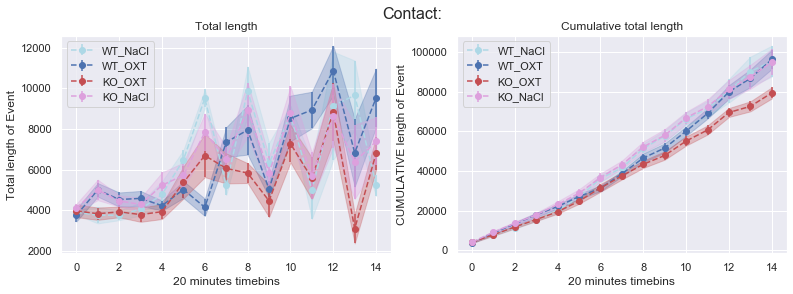

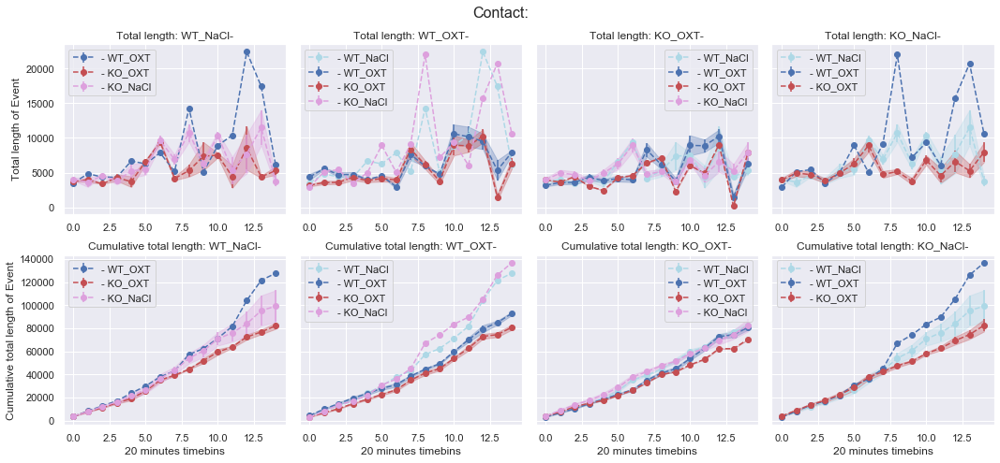

Oral-oral Contact


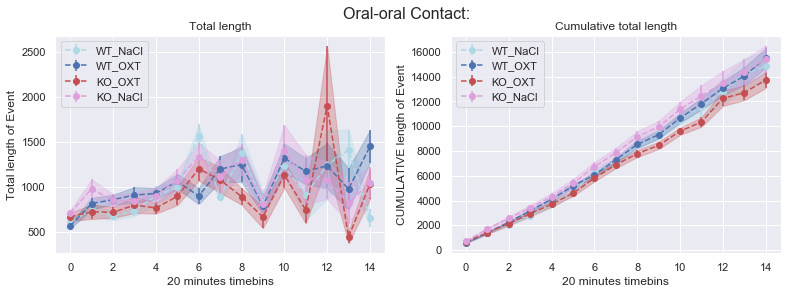

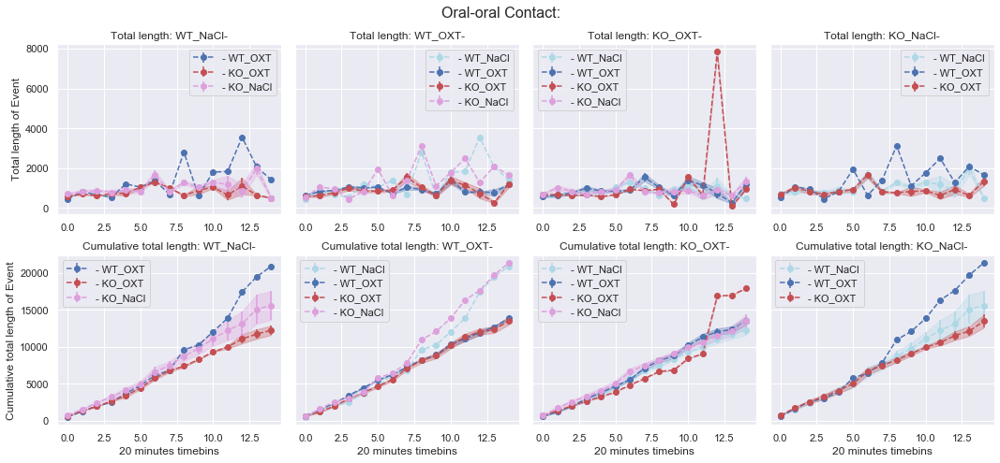

Oral-genital Contact


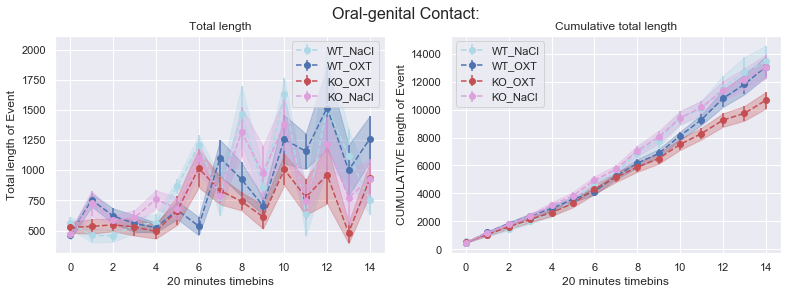

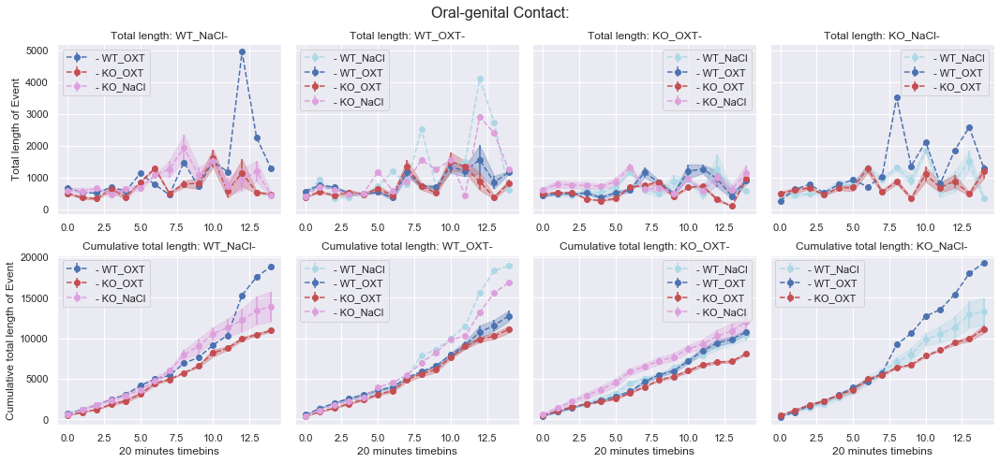

Side by side Contact


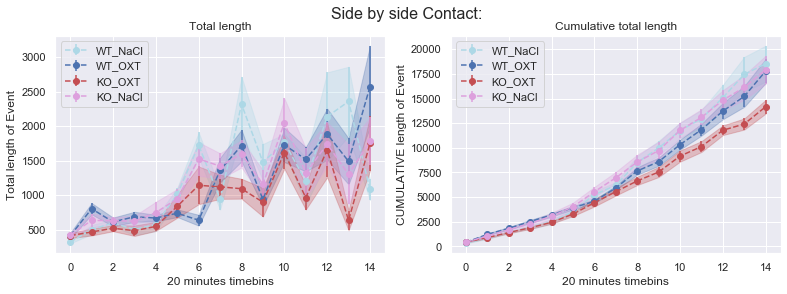

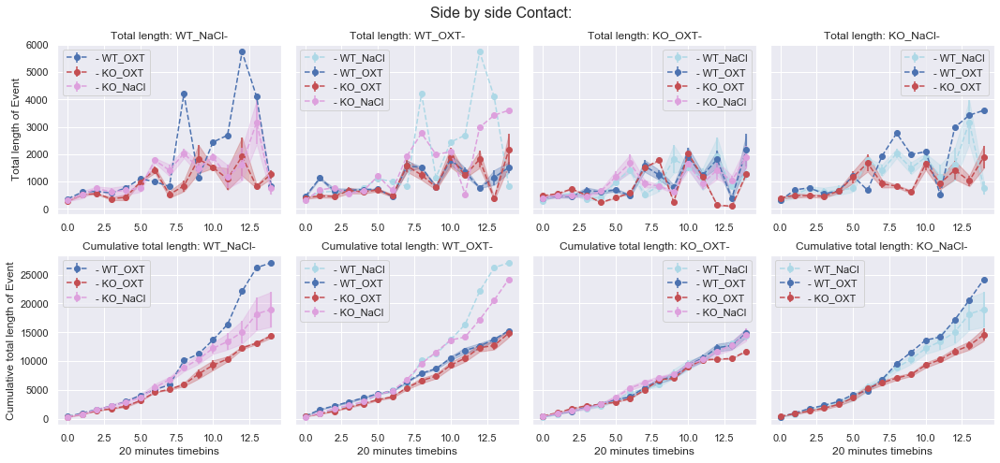

Side by side Contact, opposite way


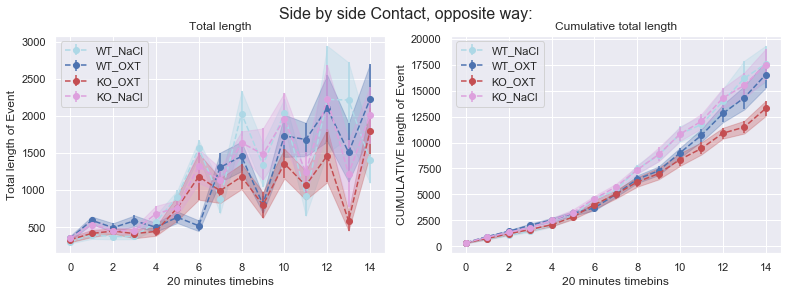

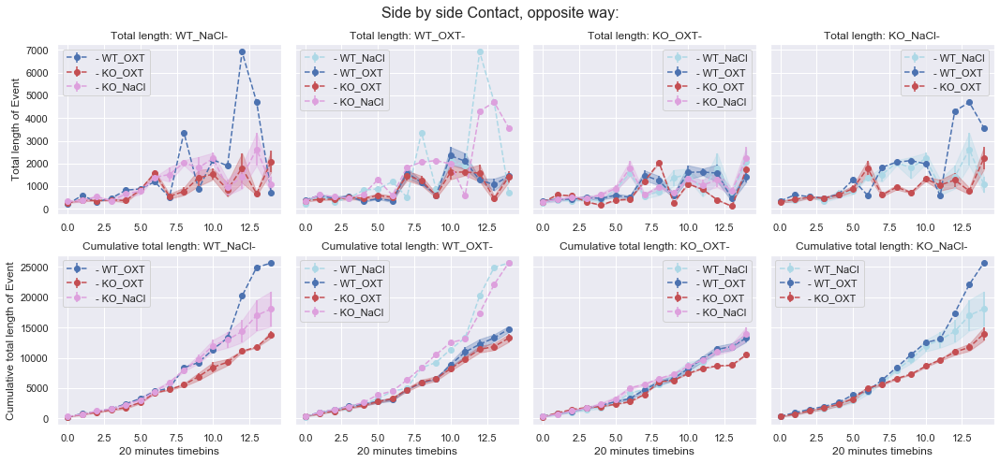

Social approach


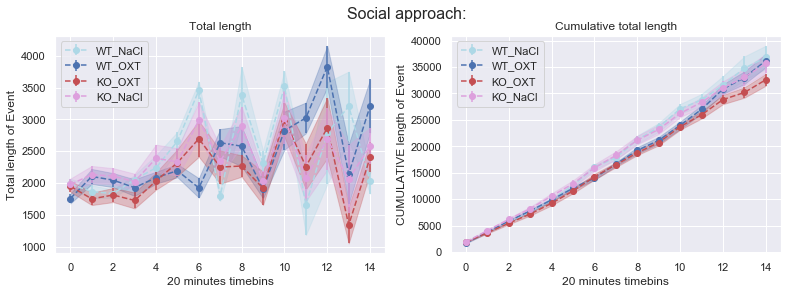

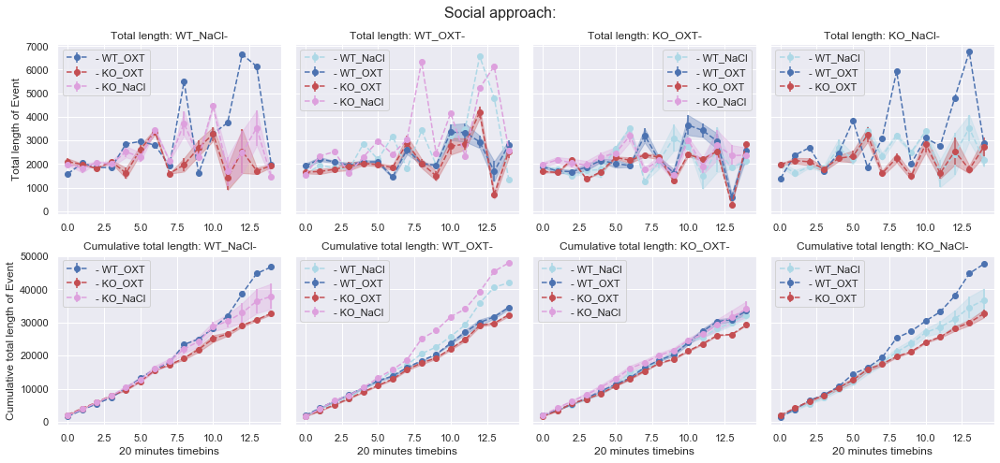

Social escape


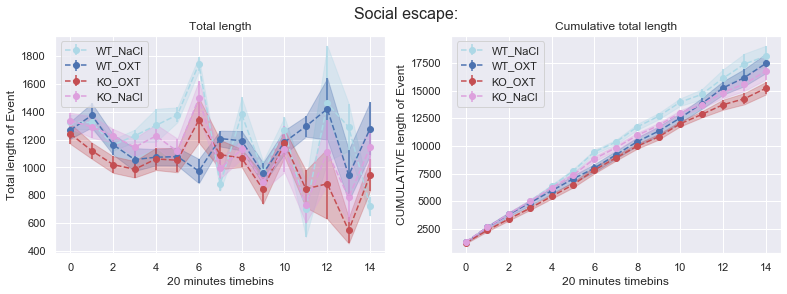

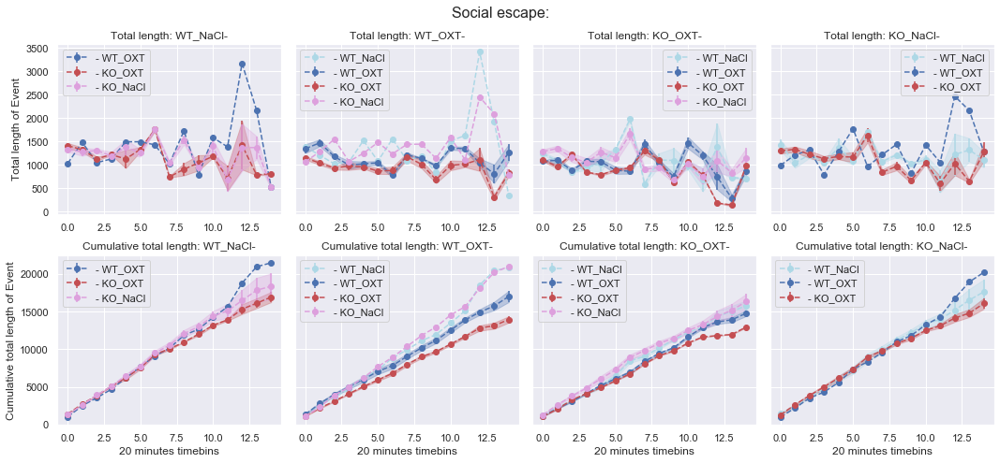

Approach contact


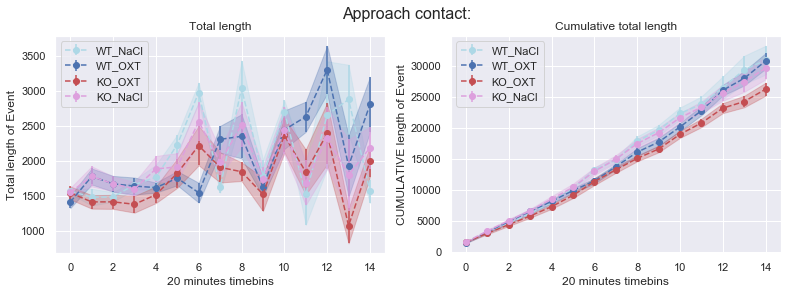

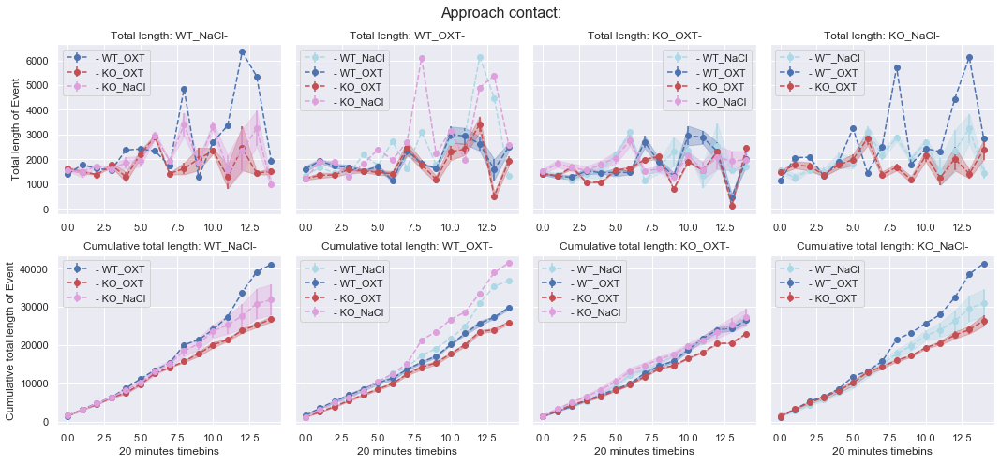

Approach rear


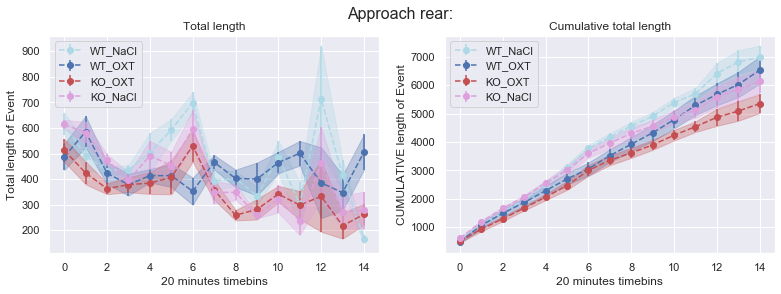

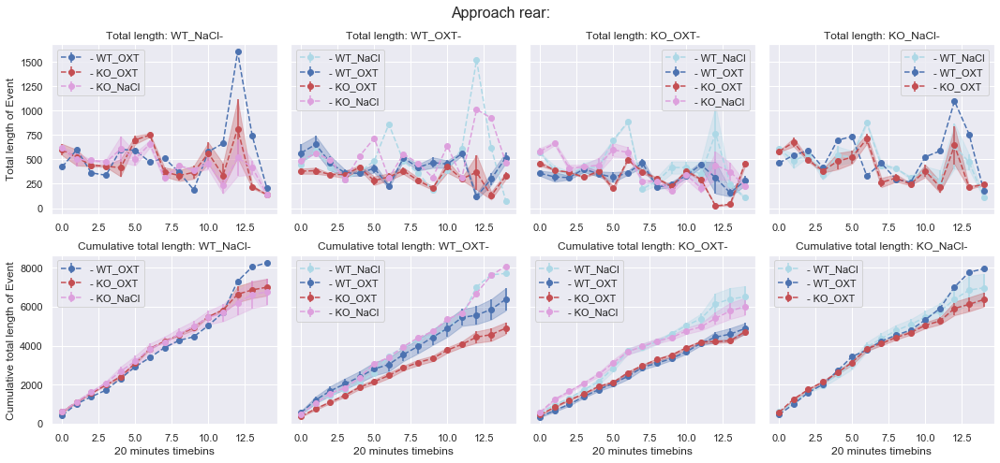

Break contact


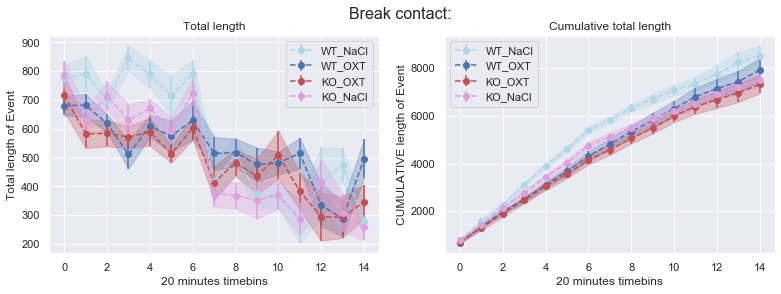

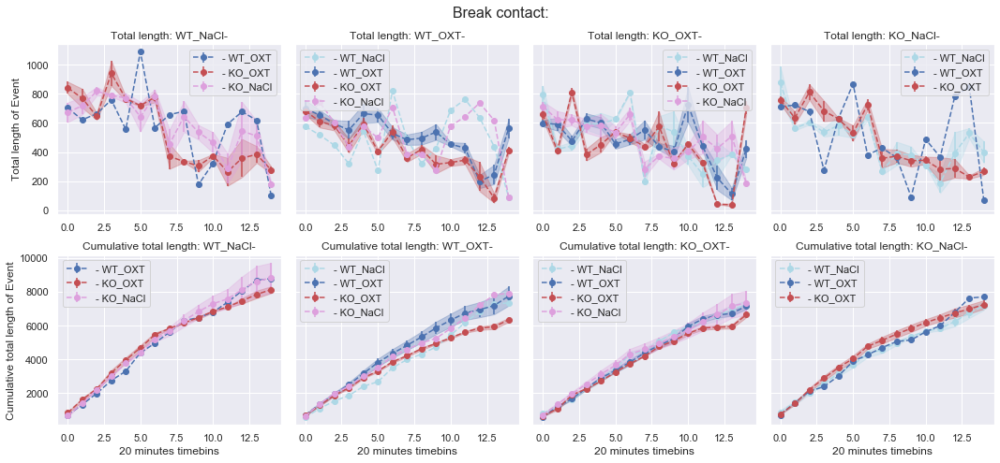

Get away


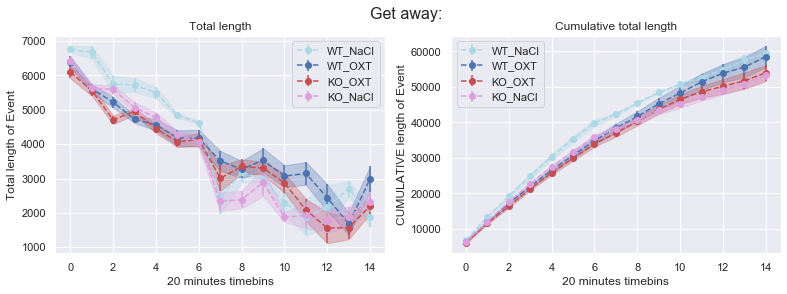

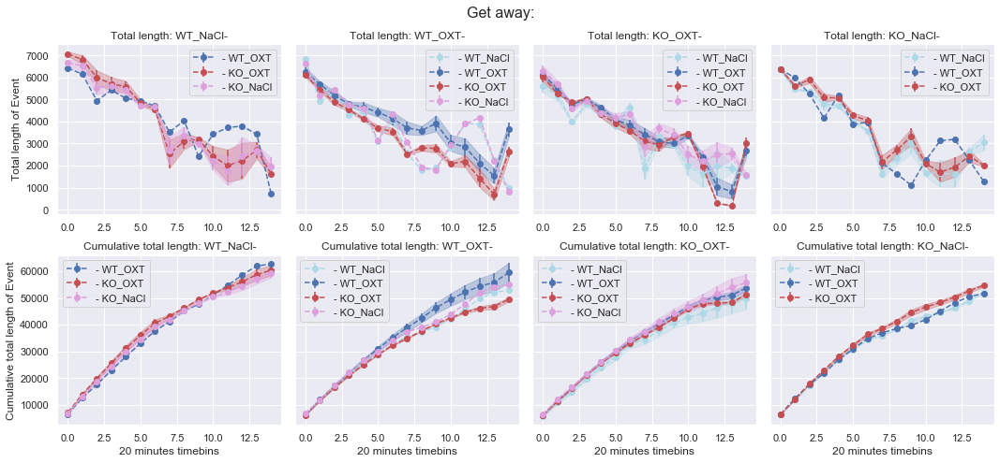

FollowZone Isolated


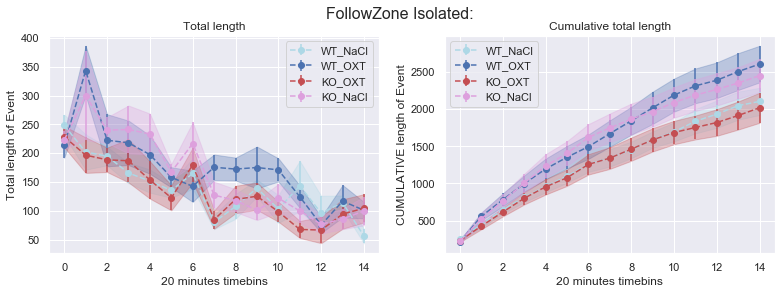

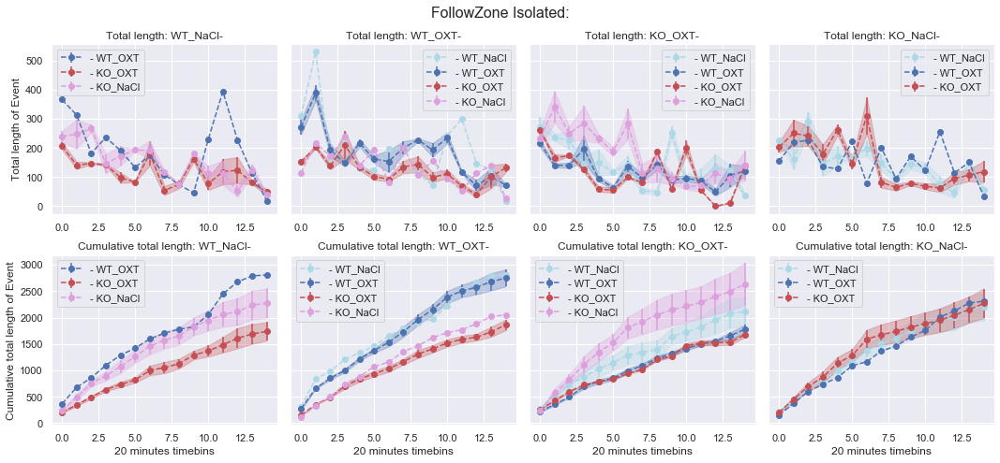

Train2


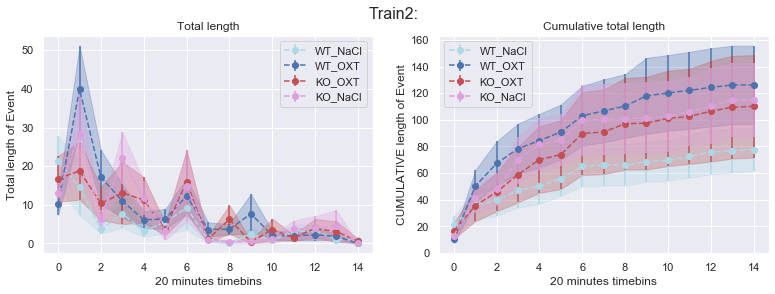

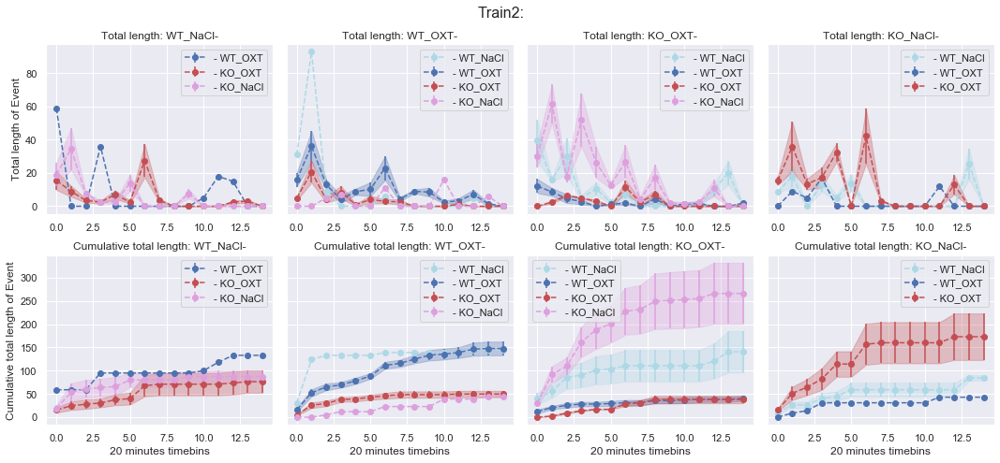

Group2


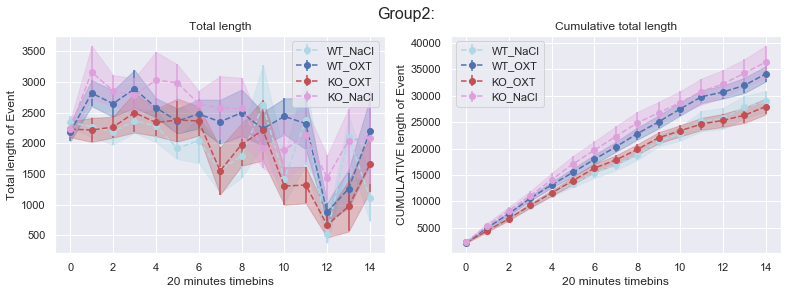

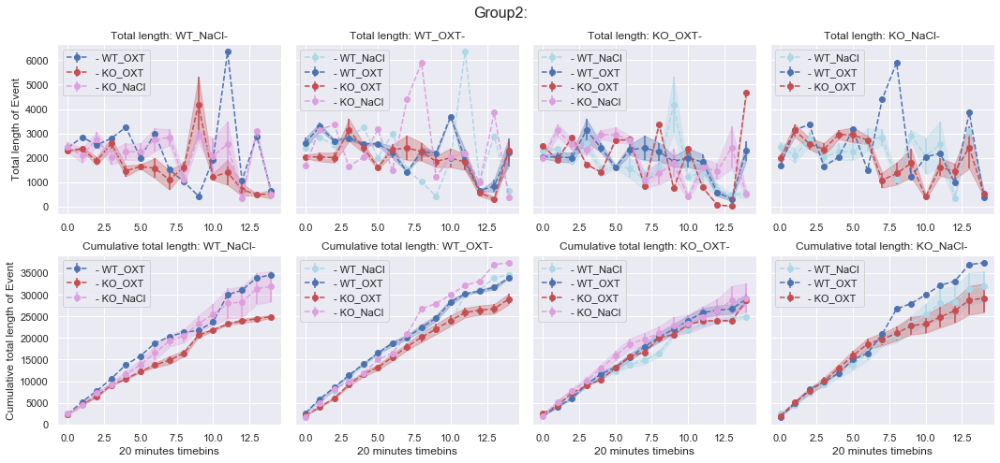

LMT2
Contact


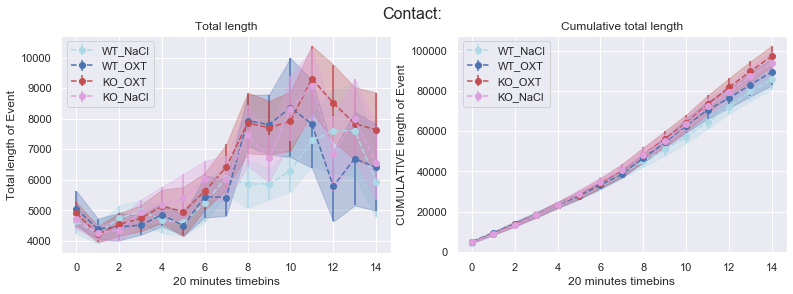

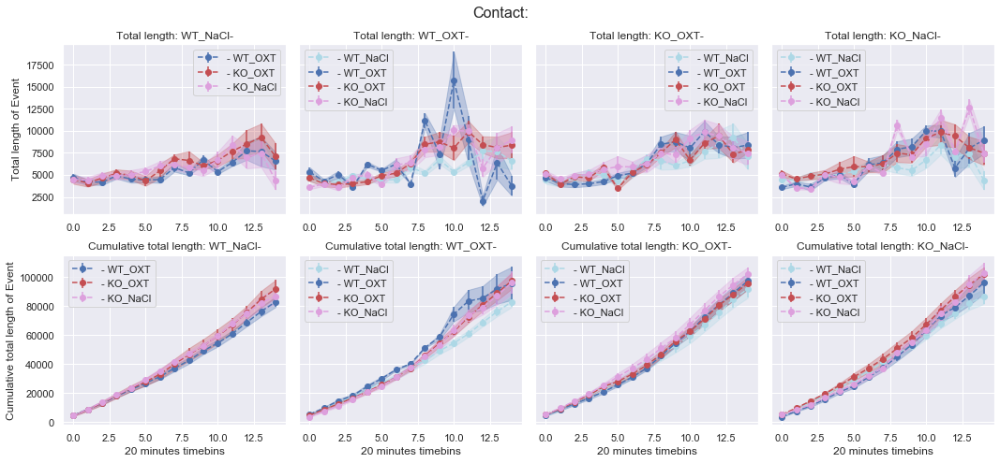

Oral-oral Contact


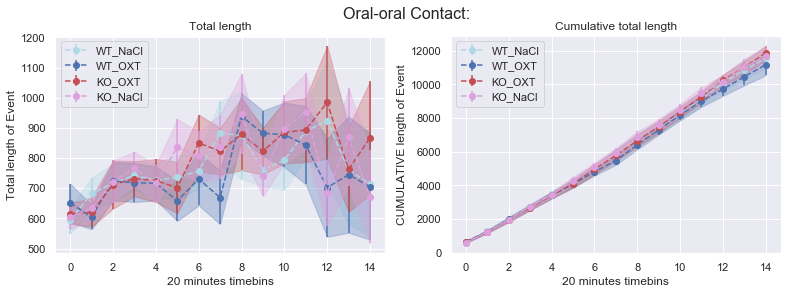

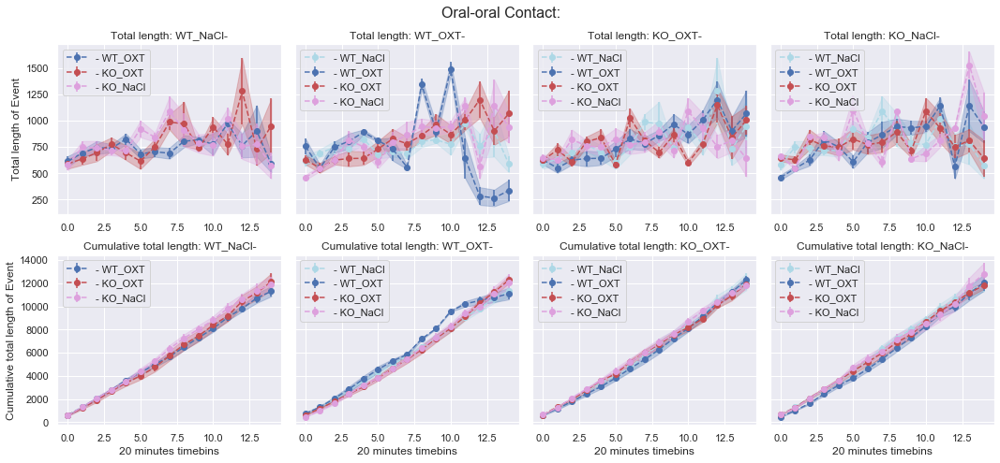

Oral-genital Contact


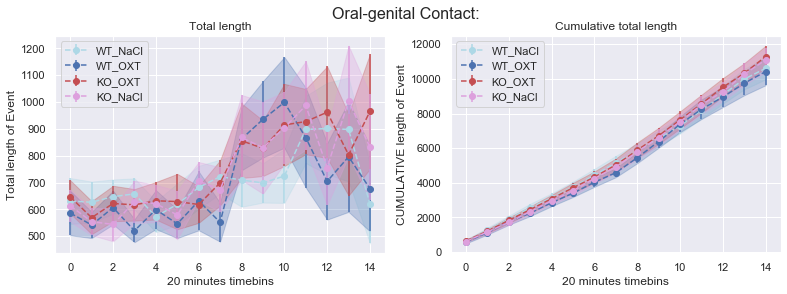

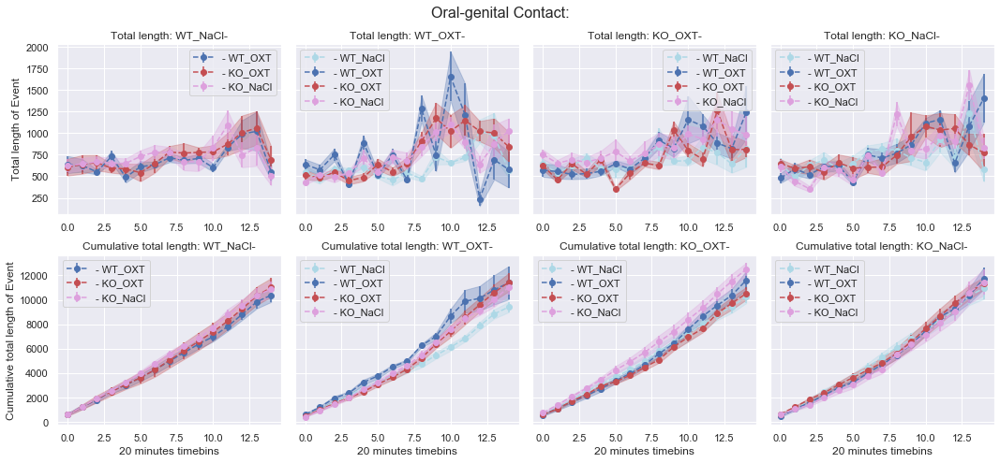

Side by side Contact


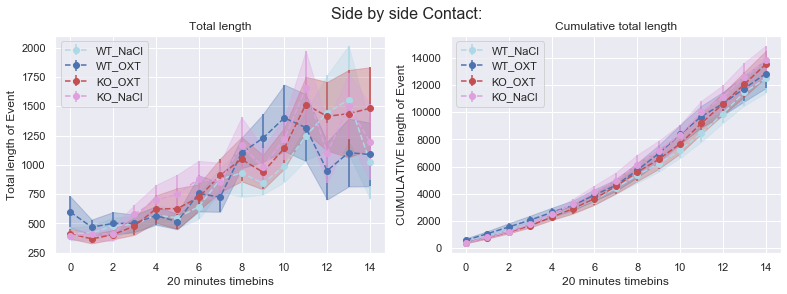

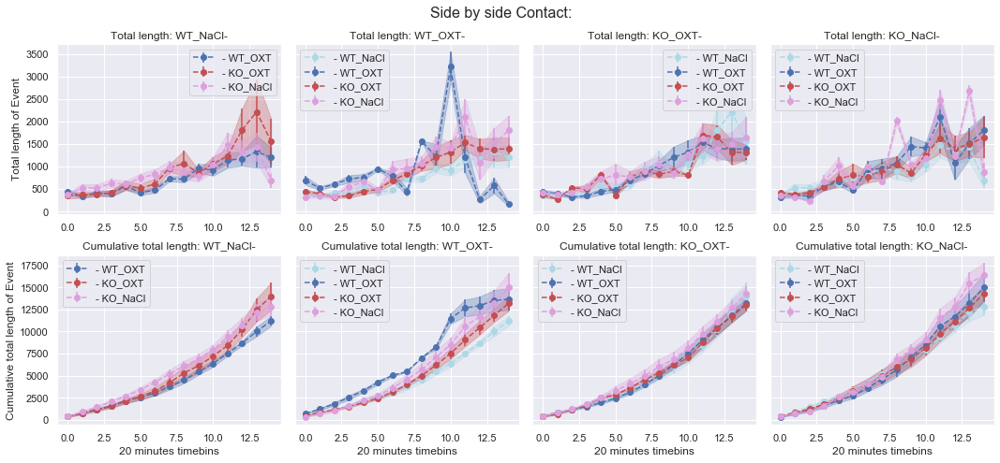

Side by side Contact, opposite way


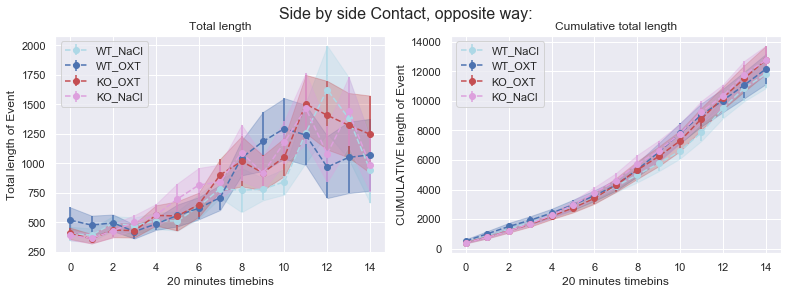

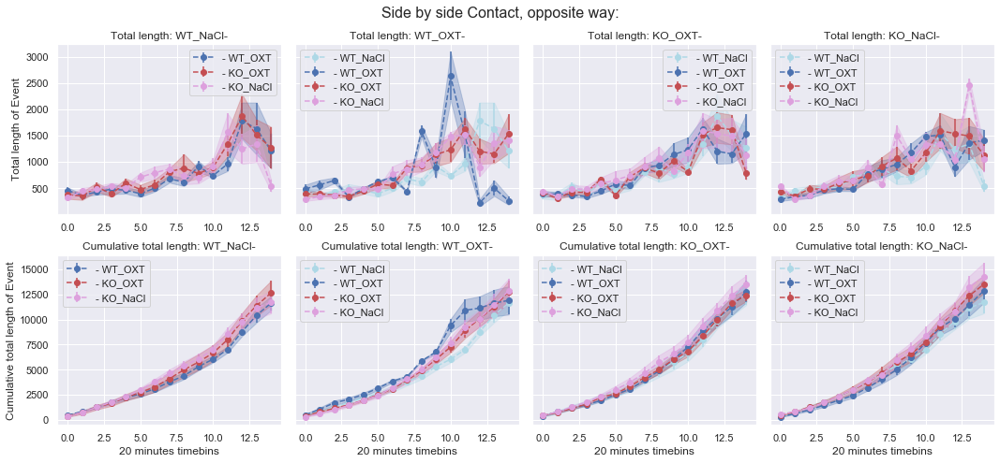

Social approach


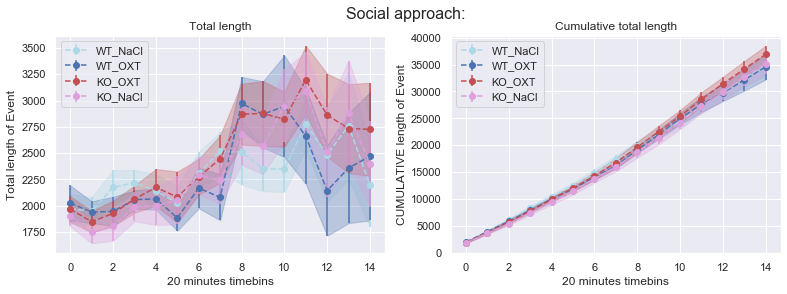

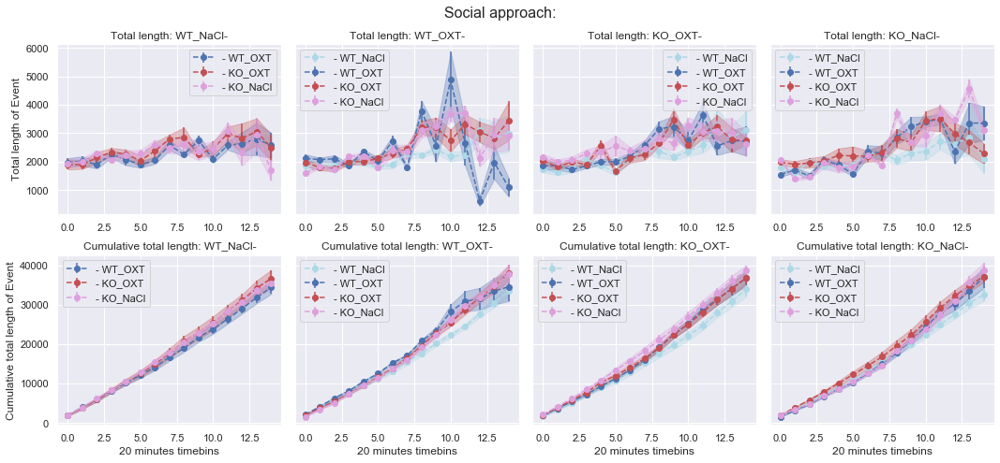

Social escape


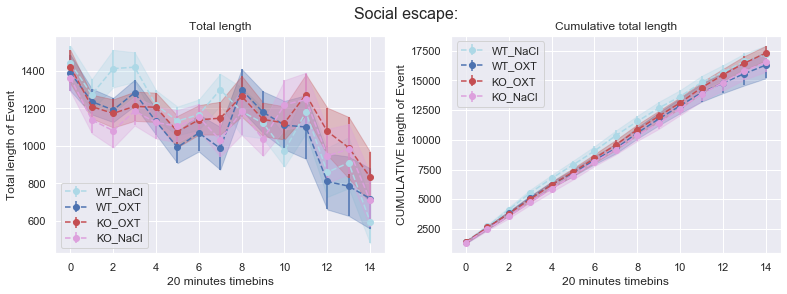

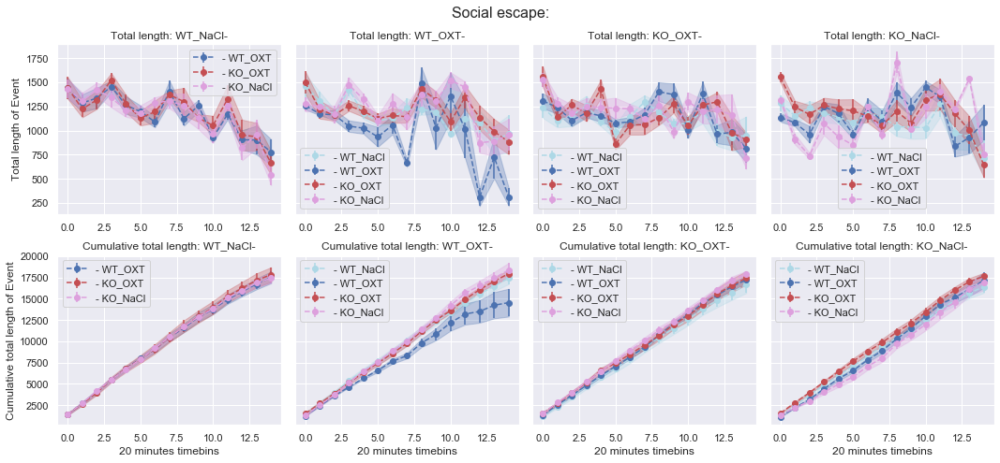

Approach contact


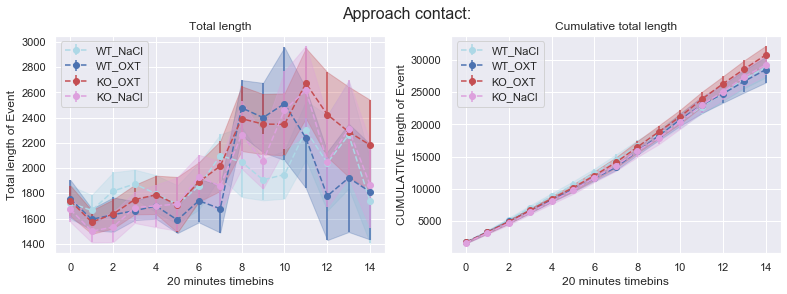

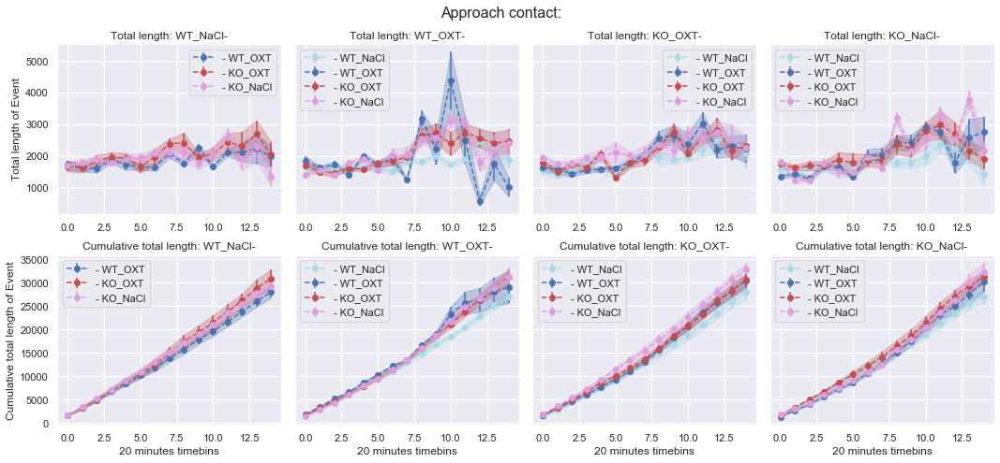

Approach rear


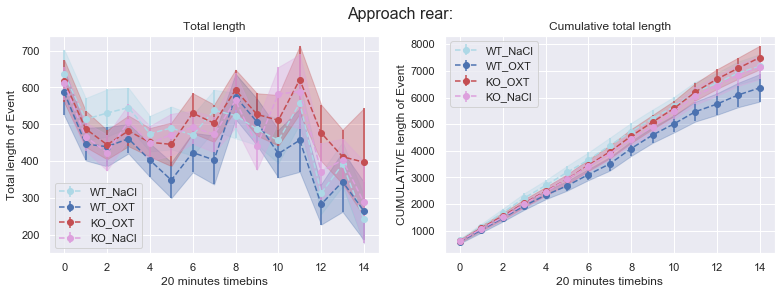

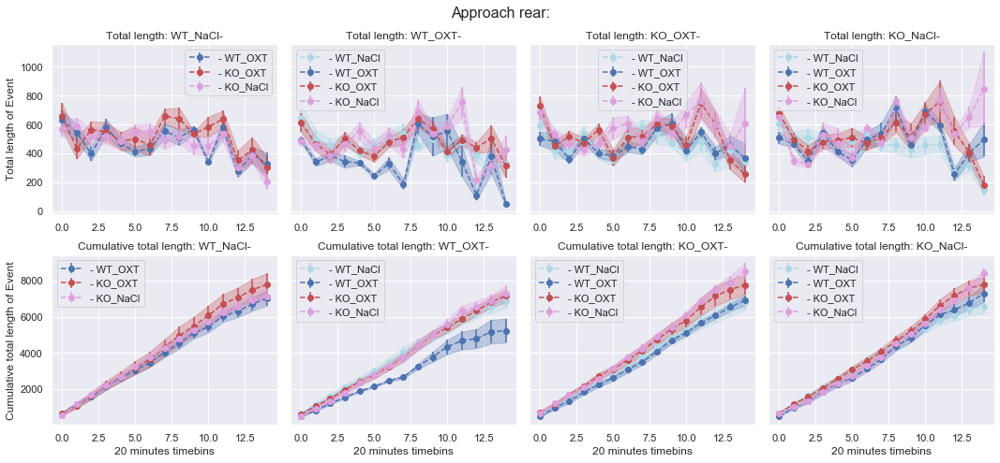

Break contact


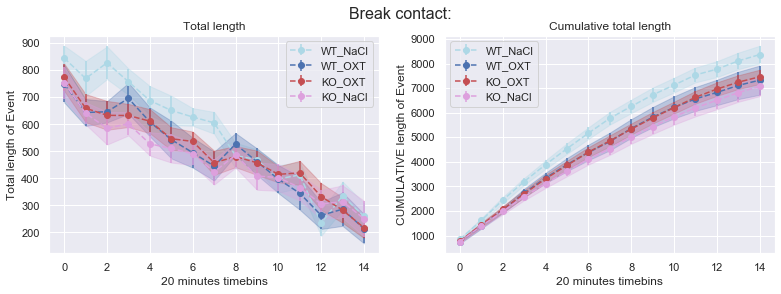

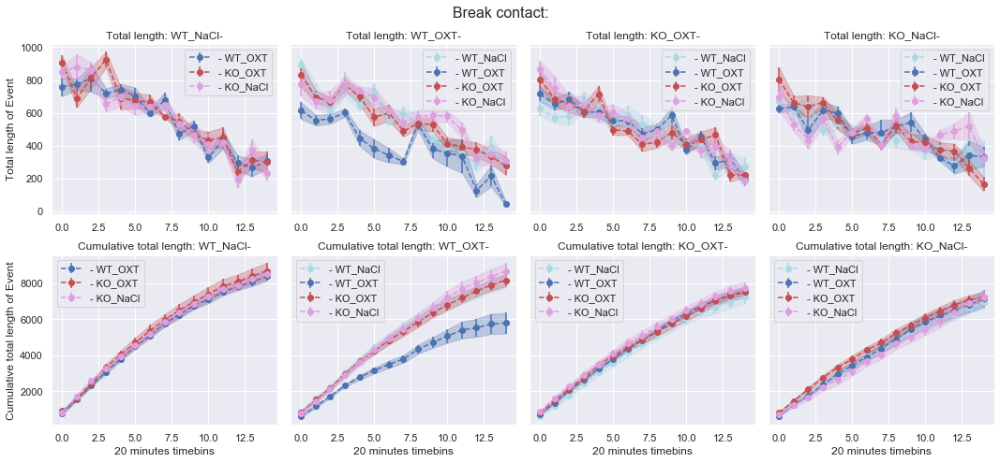

Get away


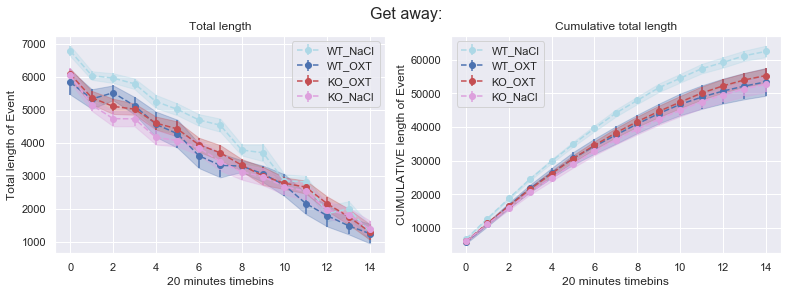

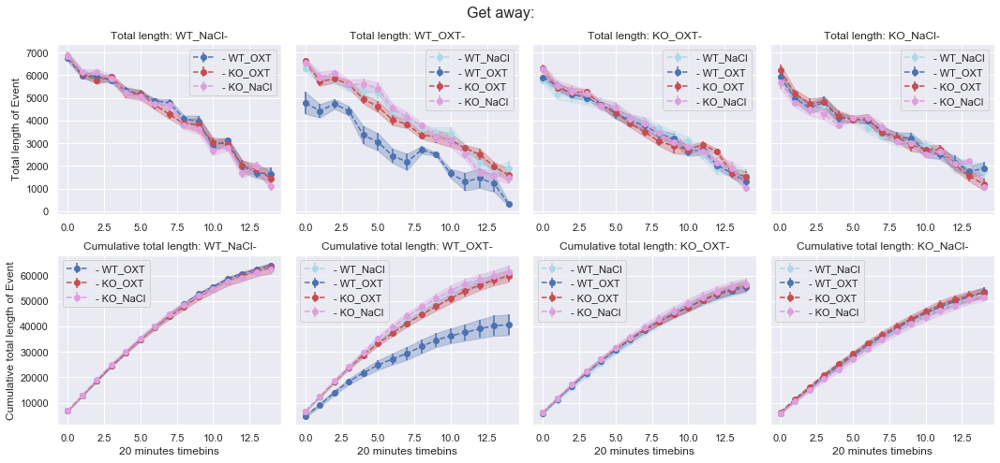

FollowZone Isolated


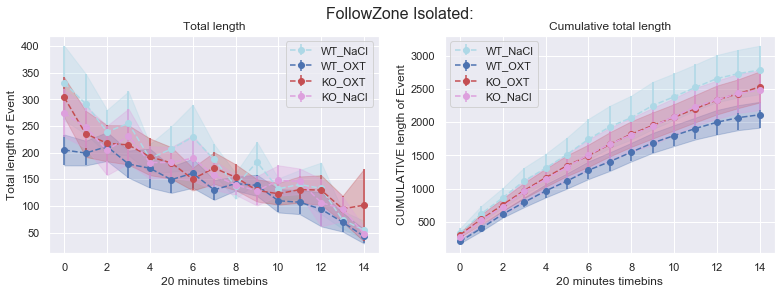

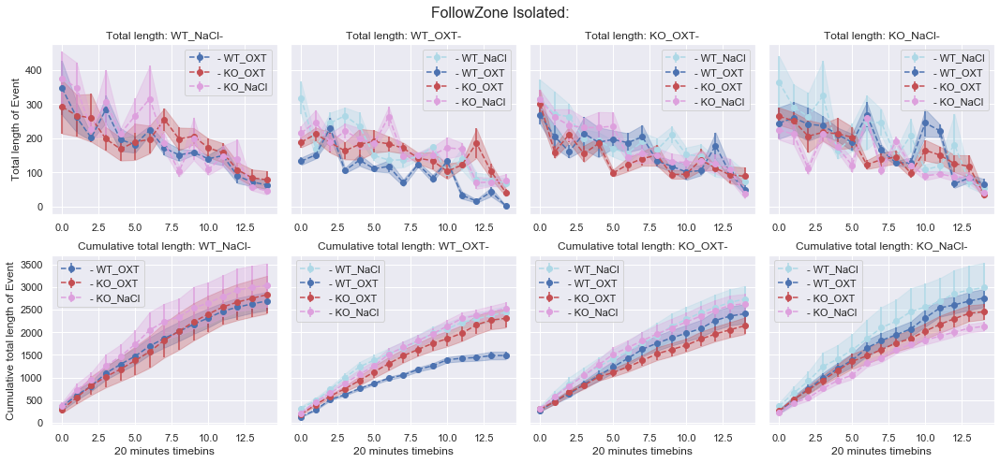

Train2


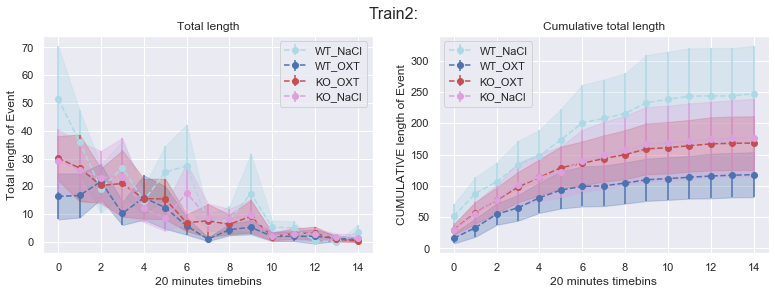

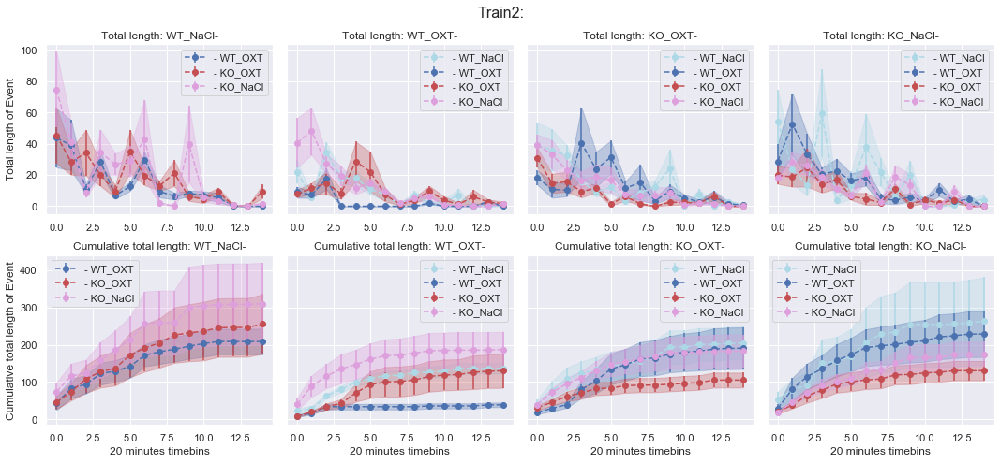

Group2


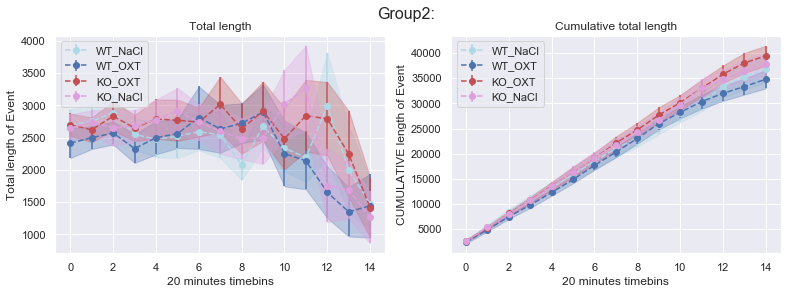

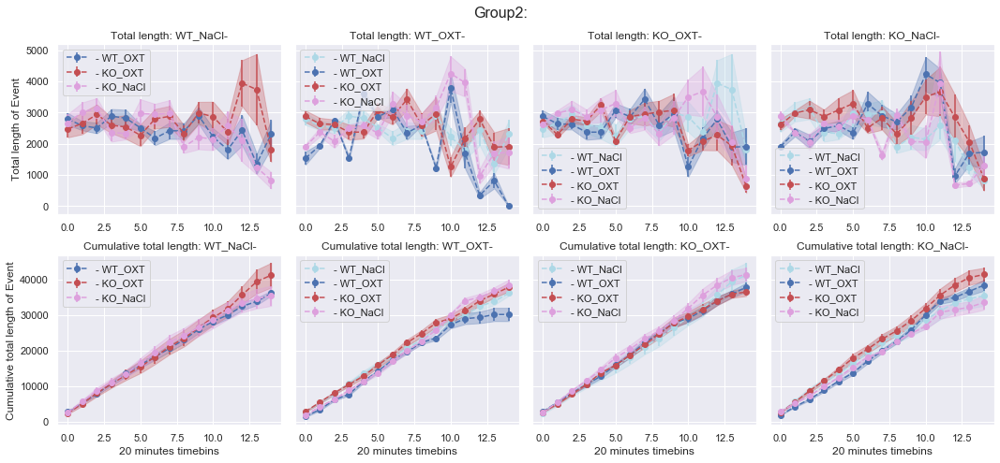

LMT3
Contact


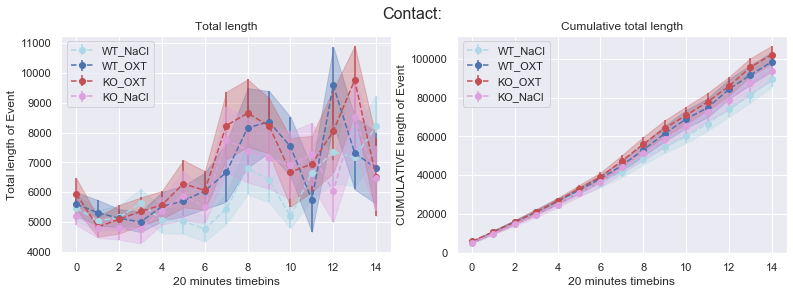

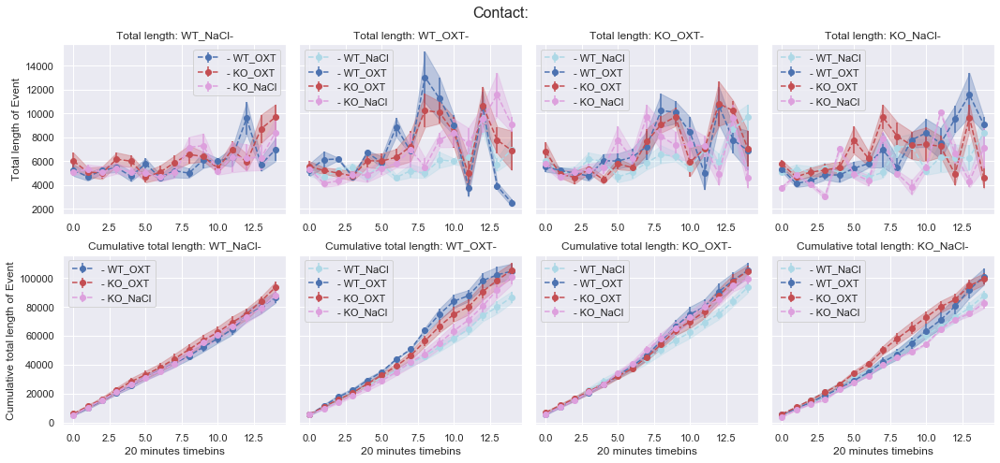

Oral-oral Contact


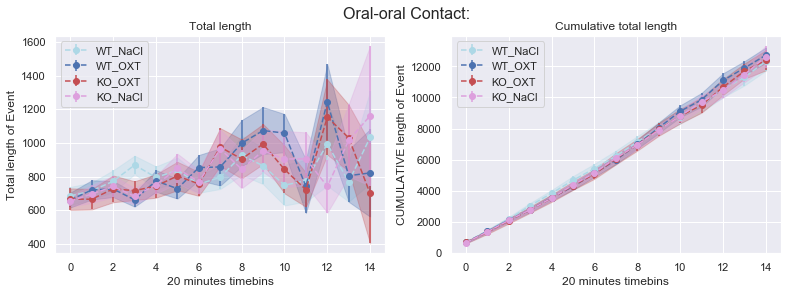

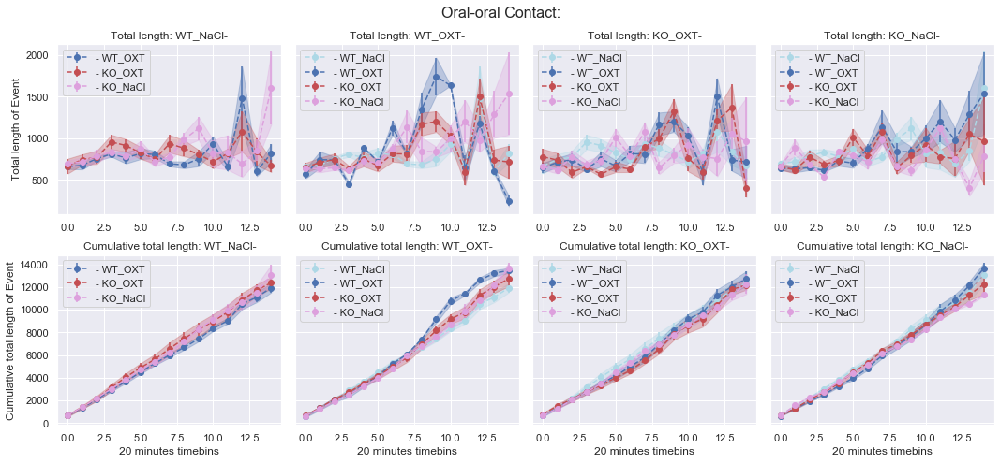

Oral-genital Contact


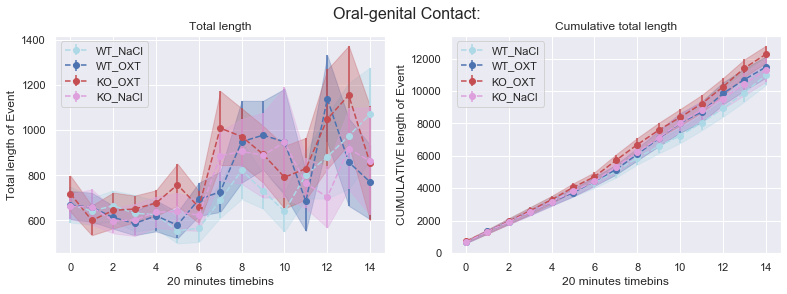

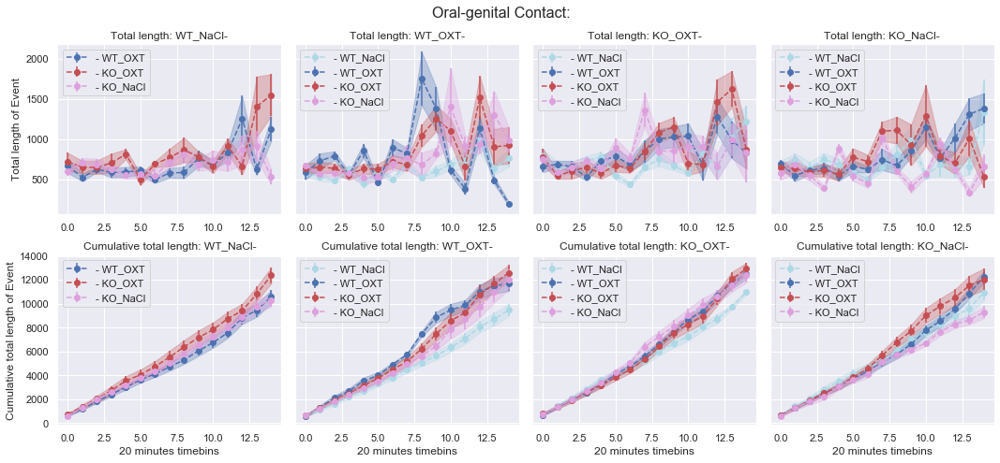

Side by side Contact


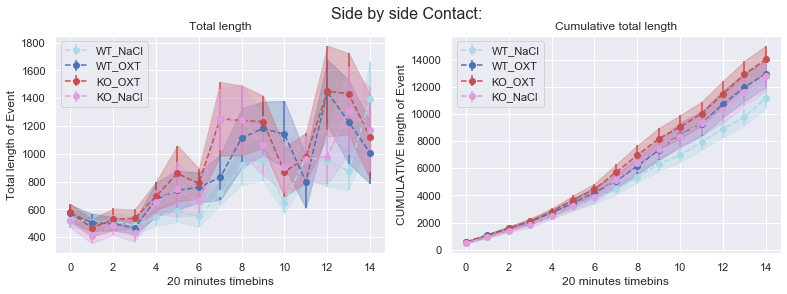

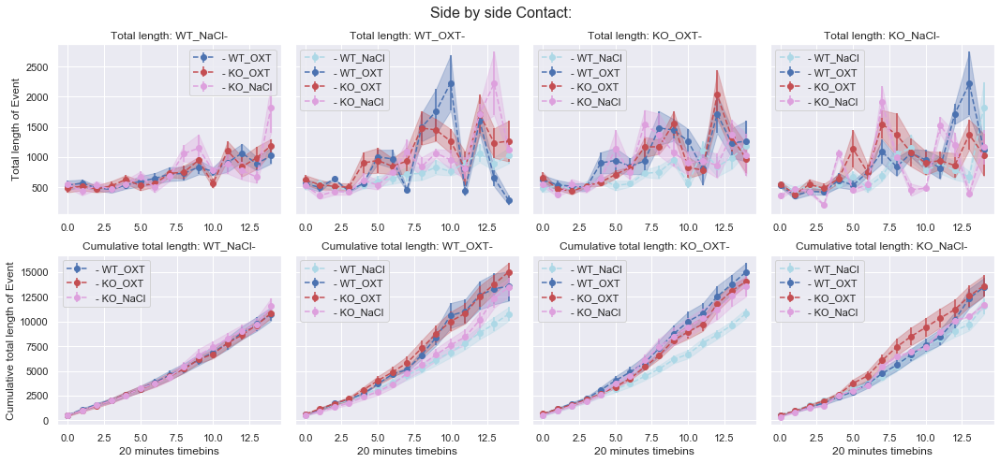

Side by side Contact, opposite way


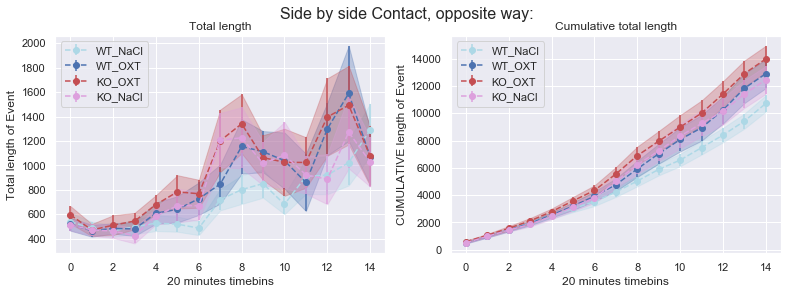

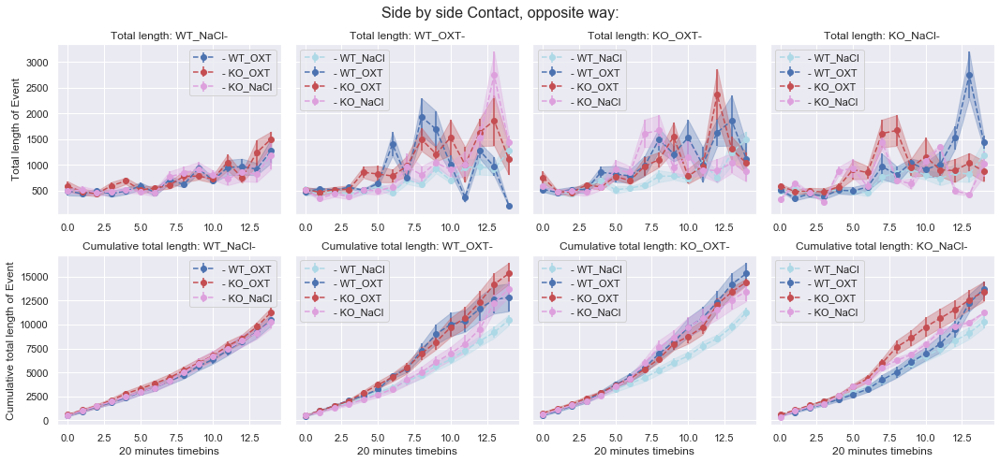

Social approach


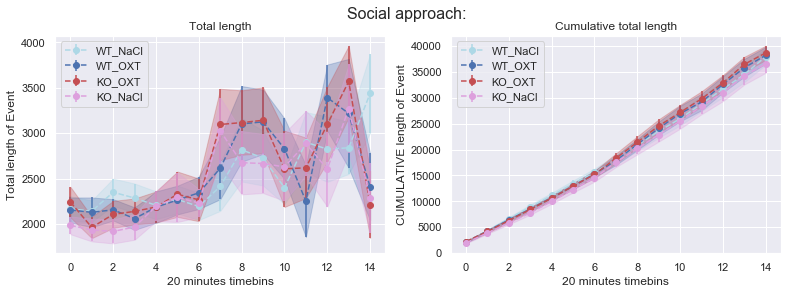

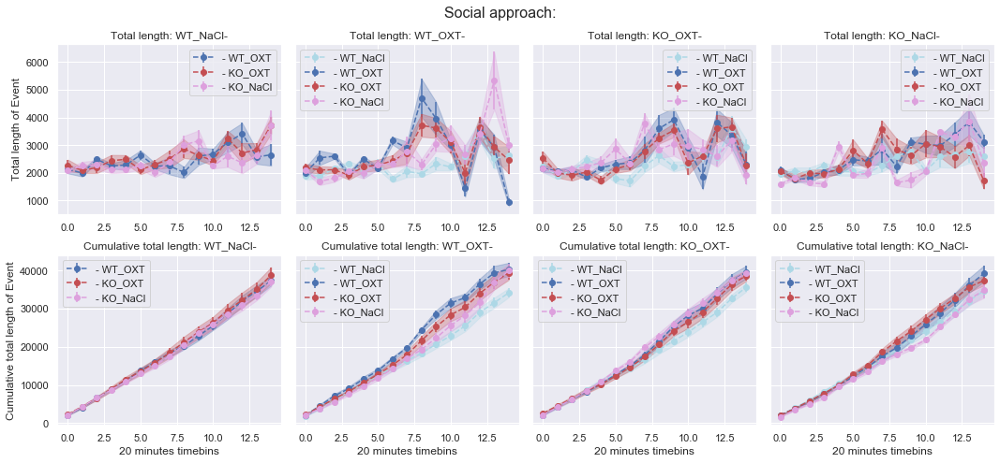

Social escape


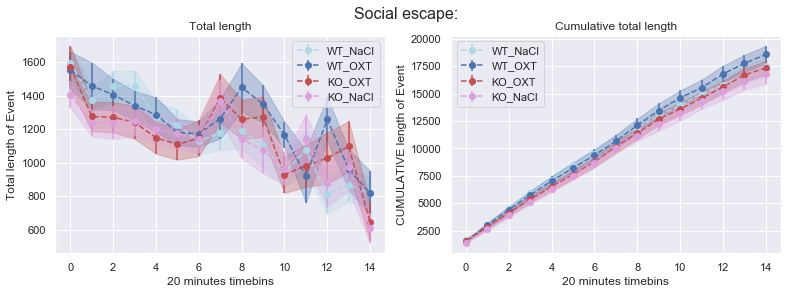

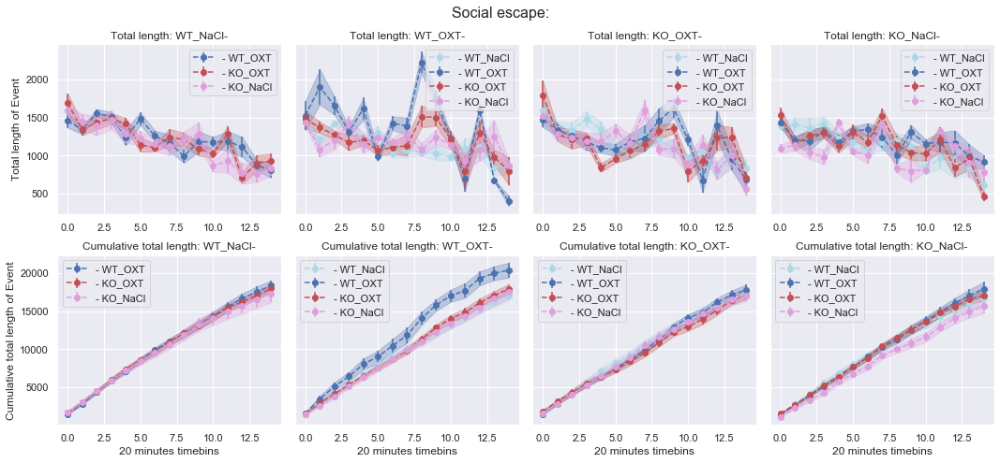

Approach contact


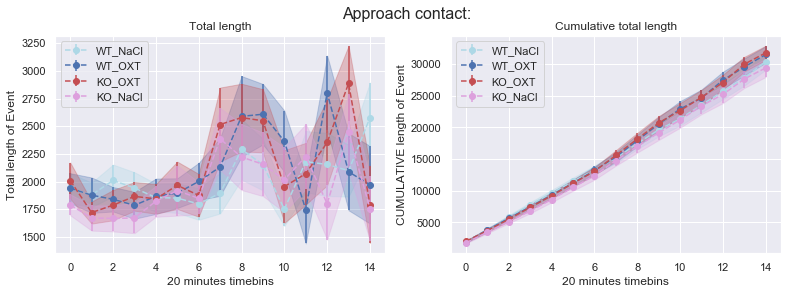

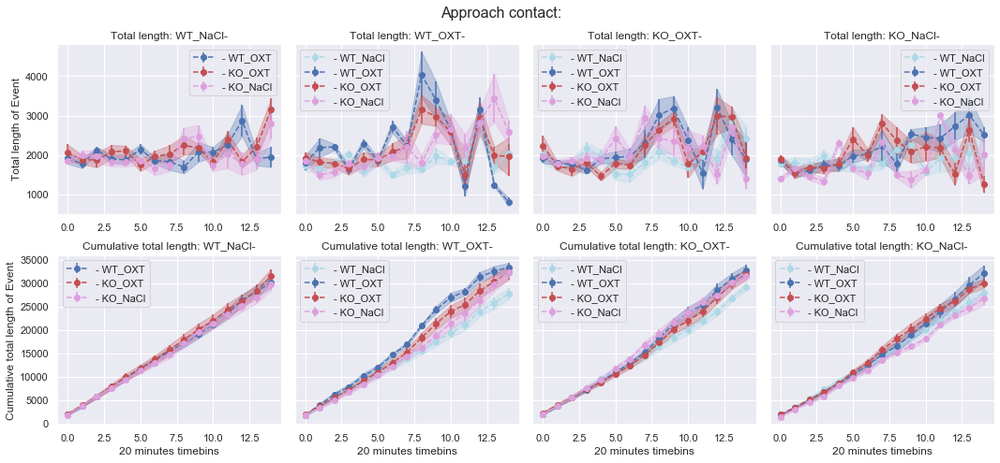

Approach rear


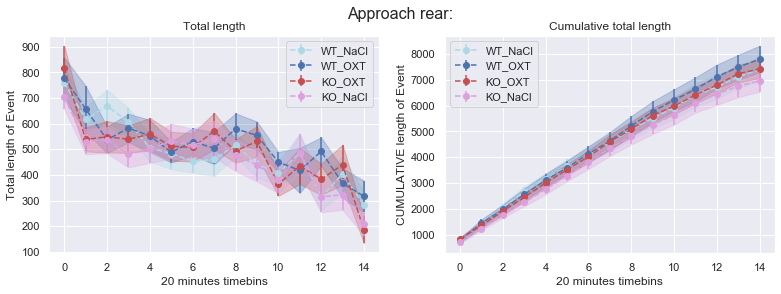

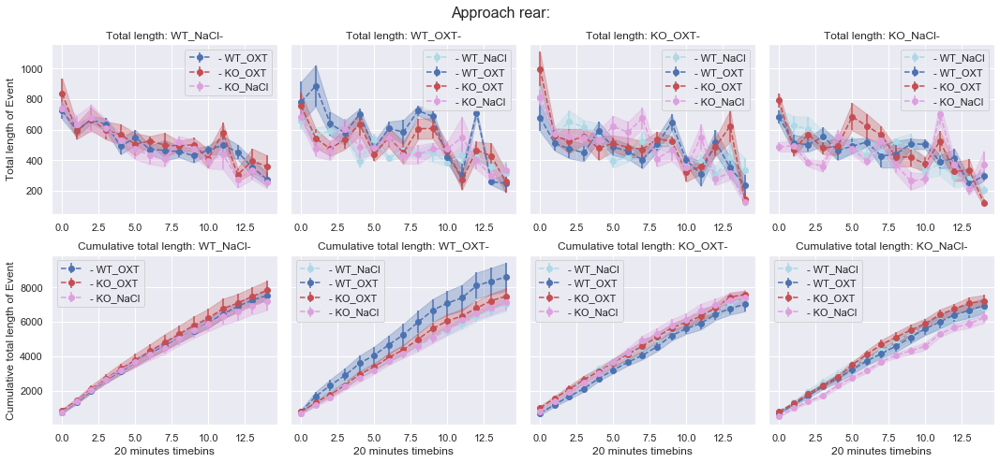

Break contact


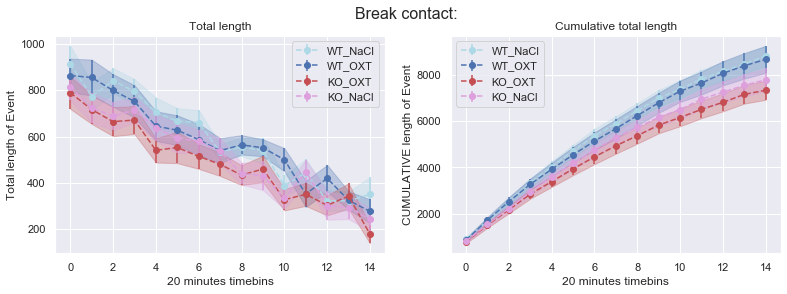

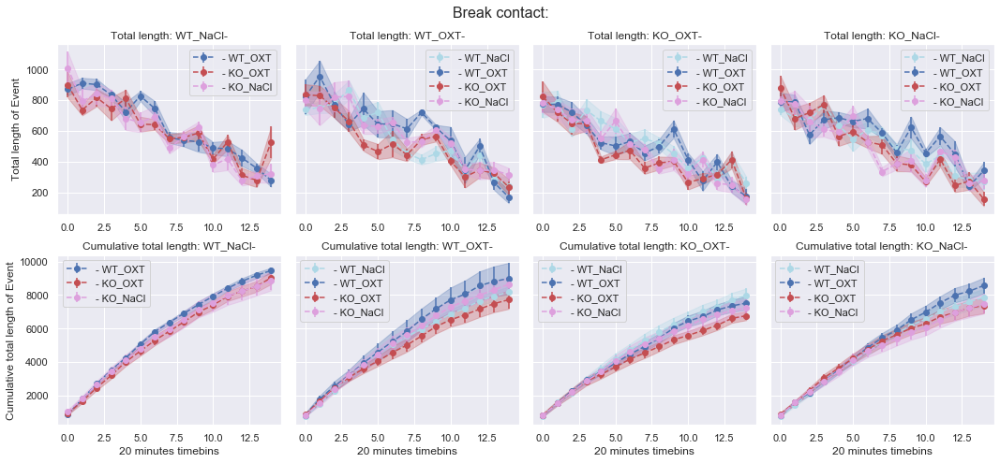

Get away


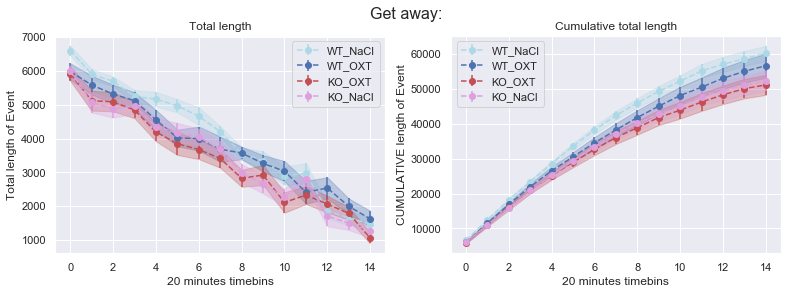

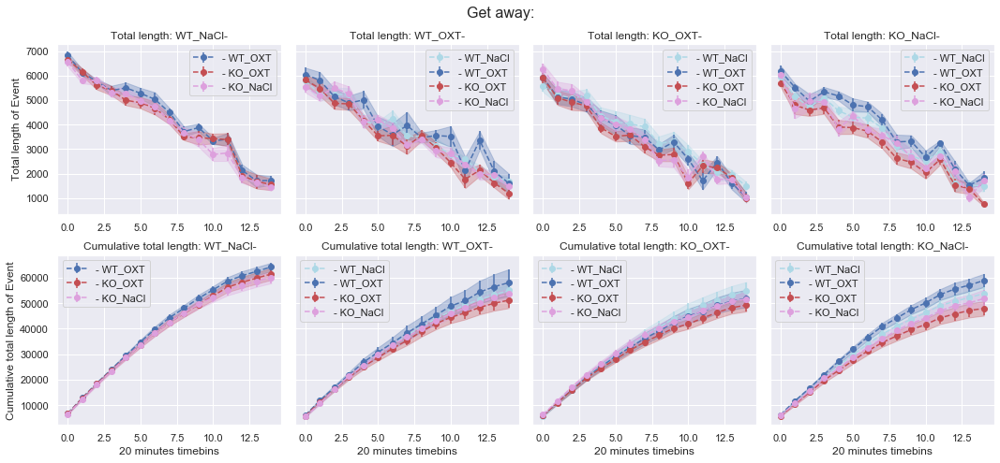

FollowZone Isolated


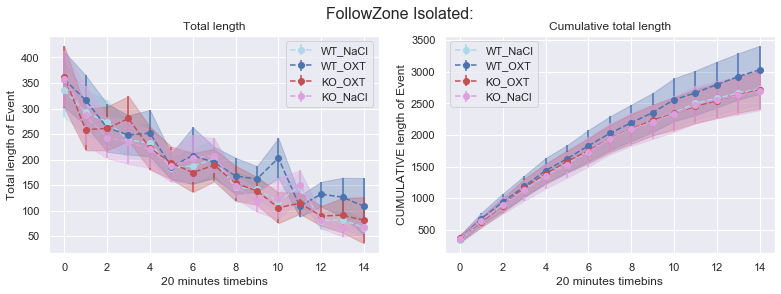

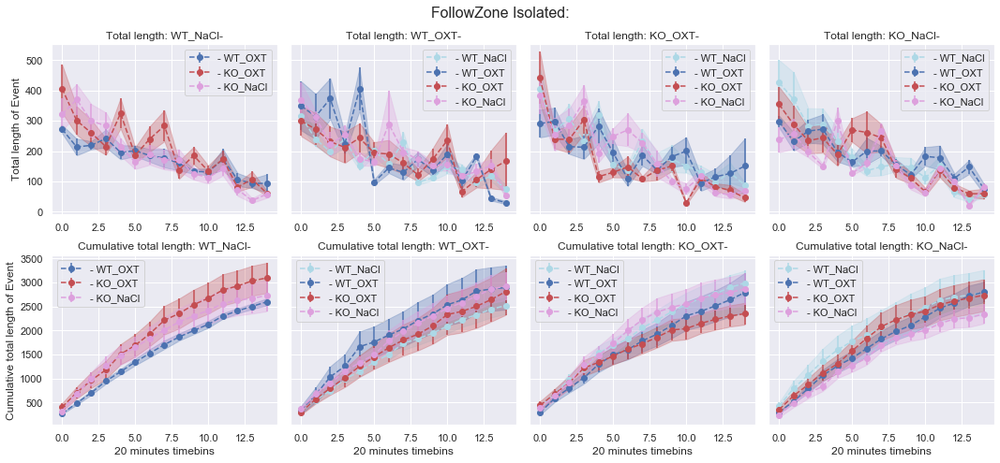

Train2


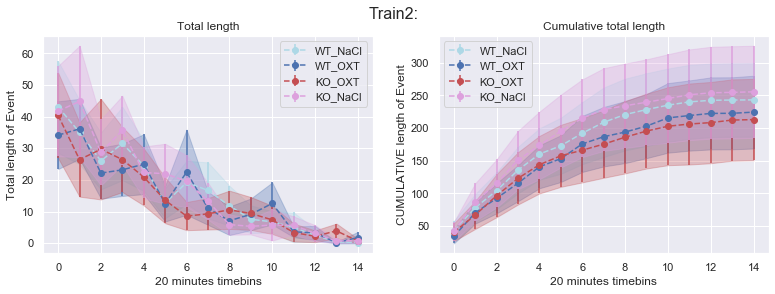

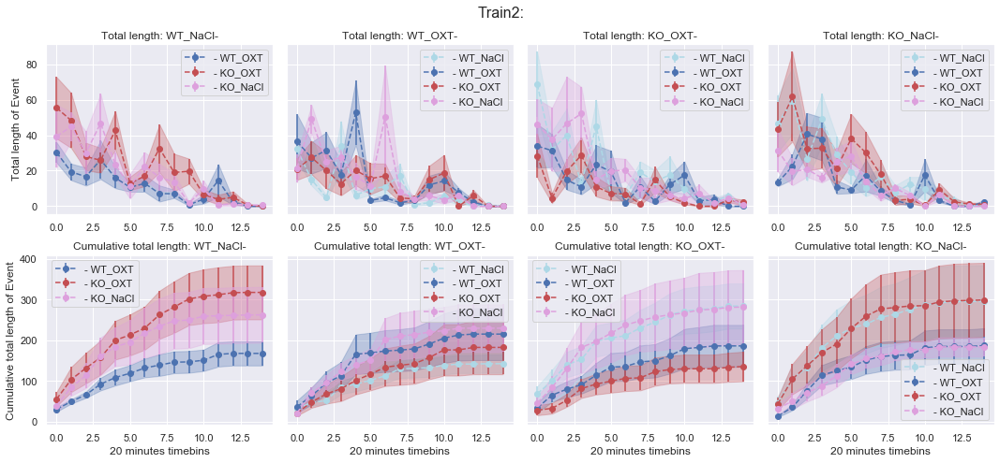

Group2


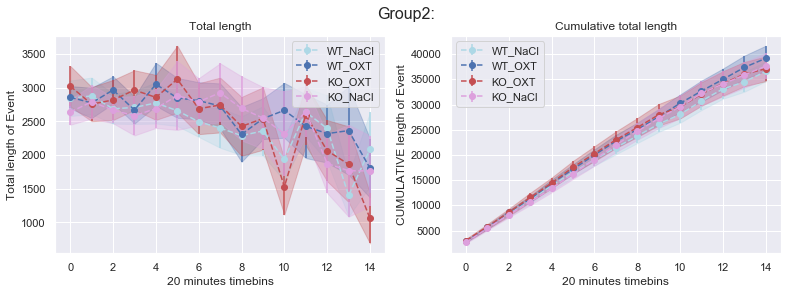

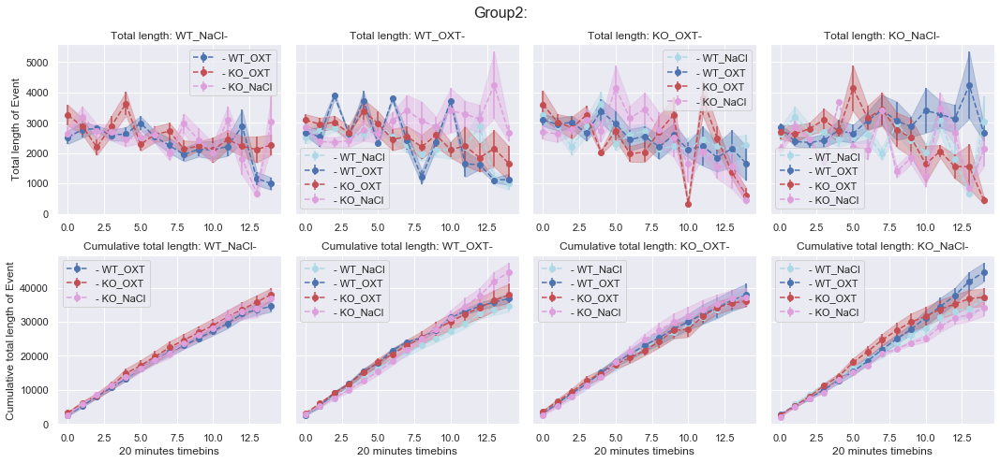

In [138]:
#Plot the data of GROUPED genotypes using the DOUBLE groupby dataframe:
#dfOne.groupby(['name','GenoA'], as_index=False).get_group(('Move','KO_OXT')).groupby(['Bin'], as_index=False)['totalLength'].mean()

# genotypes = ["WT_NaCl", "WT_OXT", "KO_OXT", "KO_NaCl"] #Do not plot Hetero mice

#Define if a behavior is bilateral or unilateral (symetric or not): NOT USED !!!
# beh_bilateral = ["Contact", 'Oral-oral Contact','Side by side Contact','Side by side Contact, opposite way','Group2']
# beh_unilateral = ['Oral-genital Contact','Social approach', 'Social escape', 'Approach contact',
#                   'Approach rear', 'Break contact', 'Get away','FollowZone Isolated', 'Train2']

genotypes = ["WT_NaCl", "WT_OXT", "KO_OXT", "KO_NaCl"] #Do not plot Hetero mice
# genotypes = dfTwo['GenoA'].unique()

behaviors = dfTwo['name'].unique()

# sessions = dfTwo['Session'].unique()
sessions = ['Hab1','LMT2','LMT3']

sns.set_palette("deep")
# sns.set_palette("colorblind")

for sess in sessions:
    print(sess)
    for beh in behaviors:
        print(beh)
        ##Fig1 for average of behaviors for the different genotypes:
        fig1, ax1 = plt.subplots(nrows=1,ncols=2,figsize=(13,4)) #Create a figure with 1 row and 2 columns of subplots
        fig1.suptitle(f"{beh}:" , fontsize=16)

        ##Fig2 for the average of genotype-genotype interaction on the different behaviors:
        fig2, ax2 = plt.subplots(nrows=2,ncols=4,figsize=(15,7), sharey ='row') #Create a figure with 2 rows and 4 columns of subplots
        fig2.suptitle(f"{beh}:" , fontsize=16)

        countGraph = 0

        for geno1 in genotypes:
    #             print(geno1)
            color = colorChoice(geno1) #colorChoice defined before!
        
            #Define the selection Condition over Behavior, Genotype-animalA:
#             sess_beh_geno1 = (dfTwo['Session']==sess) & (dfTwo['name']==beh) & (dfTwo['GenoA']==geno1)
            df_grouped = dfTwo.groupby(['Session','name','GenoA'], as_index=False).get_group((sess,beh,geno1)) #Define the Groupby dataframe

            ###Compute the average of the behaviors to plot + SEM
            x = df_grouped.groupby(['Bin'], as_index=False)['Bin'].mean() #x-axis Bins

            df_totalLen_mean = df_grouped.groupby(['Bin'])['totalLength'].mean()
            df_totalLen_std = df_grouped.groupby(['Bin'])['totalLength'].std()
            df_totalLen_sem = df_totalLen_std / math.sqrt(len(df_totalLen_std))

            ##Plot 'total length'
    #         ax1[0].plot(df_totalLen_mean.index, df_totalLen_mean, color=color, marker='o', label=geno1) #plot totalLength
            ax1[0].errorbar(x,df_totalLen_mean,df_totalLen_sem, marker='o', 
                            linestyle='--', color = color, label = geno1) #Plot The Average
            ax1[0].fill_between(x,df_totalLen_mean-df_totalLen_sem, 
                                df_totalLen_mean+df_totalLen_sem, 
                                color=color, alpha=0.3) #Plot the SEM of the average
            ax1[0].legend()
            ax1[0].set_xlabel('20 minutes timebins')
            ax1[0].set_title("Total length")
            ax1[0].set_ylabel('Total length of Event') #Y-axis label on left graph

            ####Compute the CUMULATIVE average of the behaviors to plot + SEM
            df_totalLen_cum = df_grouped.groupby(['Bin'])['totalLength_cum'].mean()
            df_totalLen_cum_std = df_grouped.groupby(['Bin'])['totalLength_cum'].std()
            df_totalLen_cum_sem = df_totalLen_cum_std / math.sqrt(len(df_totalLen_cum_std))

            ##Plot 'CUMULATIVE total length'
    #         df_totalLen_cum.plot(x='Bin', y='totalLength_cum', color=color, marker='o', label=geno1, ax=ax[1]) #plot Cumulative Length
            ax1[1].errorbar(x,df_totalLen_cum,df_totalLen_cum_sem, marker='o', 
                            linestyle='--', color = color, label = geno1) #Plot The Average
            ax1[1].fill_between(x,df_totalLen_cum-df_totalLen_cum_sem, 
                                df_totalLen_cum+df_totalLen_cum_sem, 
                                color=color, alpha=0.3) #Plot the SEM of the average
            ax1[1].legend()
            ax1[1].set_xlabel('20 minutes timebins')
            ax1[1].set_title("Cumulative total length")
            ax1[1].set_ylabel('CUMULATIVE length of Event')

            for geno2 in genotypes:
                color = colorChoice(geno2) #colorChoice defined before!
                
                ##Define the selection Condition over Behavior, Genotype-animalA and Genotype-animalB:
                sess_beh_geno1_geno2 = (dfTwo['Session']==sess) & (dfTwo['name']==beh) & (dfTwo['GenoA']==geno1) & (dfTwo['GenoB']==geno2) 

                ##Define the Groupby dataframe:
                if len(dfTwo[(dfTwo['GenoA']==geno1) & (dfTwo['GenoB']==geno2)]) == 0:#NO Geno1-Geno2 match
    #                 print(f"No match between {geno1} and {geno2}")
                    continue
                if len(dfTwo[sess_beh_geno1_geno2]) == 0: #Controls if there is no data between geno1-geno2
                    continue
                df_grouped2 = dfTwo.groupby(['Session','name','GenoA', 'GenoB'], 
                                            as_index=False).get_group((sess,beh,geno1, geno2))

                ##Plot data of Total Length
                x2 = df_grouped2.groupby(['Bin'], as_index=False)['Bin'].mean() #x-axis Bins

                df_totalLen_mean2 = df_grouped2.groupby(['Bin'])['totalLength'].mean()
                df_totalLen_std2 = df_grouped2.groupby(['Bin'])['totalLength'].std()
                df_totalLen_sem2 = df_totalLen_std2 / math.sqrt(len(df_totalLen_std))

    #            ax2[0,countGraph].plot(df_totalLen_mean2.index, df_totalLen_mean, marker='o', label=f"-{geno2}") #plot totalLength
                ax2[0,countGraph].errorbar(x2,df_totalLen_mean2,df_totalLen_sem2, label=f"- {geno2}",
                                           linestyle='--', marker='o', color = color) #Plot The error bars
                ax2[0,countGraph].fill_between(x2,df_totalLen_mean2-df_totalLen_sem2,
                                               df_totalLen_mean2+df_totalLen_sem2, 
                                               alpha=0.3, color = color) #Plot the SEM of the average
                ax2[0,countGraph].legend()
#                 ax2[0,countGraph].set_xlabel('20 minutes timebins')
                ax2[0,countGraph].set_title(f"Total length: {geno1}-")
                ax2[0,0].set_ylabel('Total length of Event') #Y-axis label on left graph

                ##PLot data of CUMULATIVE total length
                x2_cum = df_grouped2.groupby(['Bin'], as_index=False)['Bin'].mean() #x-axis Bins

                df_totalLen_mean2_cum = df_grouped2.groupby(['Bin'])['totalLength_cum'].mean()
                df_totalLen_std2_cum = df_grouped2.groupby(['Bin'])['totalLength_cum'].std()
                df_totalLen_sem2_cum = df_totalLen_std2_cum / math.sqrt(len(df_totalLen_std2_cum))

    #            ax2[0,countGraph].plot(df_totalLen_mean2.index, df_totalLen_mean, marker='o', label=f"-{geno2}") #plot totalLength
                ax2[1,countGraph].errorbar(x2_cum,df_totalLen_mean2_cum,df_totalLen_sem2_cum, label=f"- {geno2}",
                                           linestyle='--', marker='o', color = color) #Plot The error bars
                ax2[1,countGraph].fill_between(x2_cum,df_totalLen_mean2_cum-df_totalLen_sem2_cum,
                                               df_totalLen_mean2_cum+df_totalLen_sem2_cum, 
                                               alpha=0.3, color = color) #Plot the SEM of the average
                ax2[1,countGraph].legend()
                ax2[1,countGraph].set_xlabel('20 minutes timebins')
                ax2[1,countGraph].set_title(f"Cumulative total length: {geno1}-")
                ax2[1,0].set_ylabel('Cumulative total length of Event') #Y-axis label on left graph

            countGraph +=1

        plt.tight_layout() #Display nicely the subgraphs (and fits the png size)
        plt.subplots_adjust(top=0.90) #Adjust where the plots starts (Otherwise overlap with title)

#         plt.show() #Display the figure
#         fig1.savefig(f"{sess}_20min-bins_{beh}_Beh-Two_avg.png", dpi=100) # SAVE A .PNG FIGURE
#         fig2.savefig(f"{sess}_20min-bins_{beh}_Beh-Two_details.png", dpi=100) # SAVE A .PNG FIGURE
        fig1.savefig(my_path + f'Groups Graphs/{sess}_20min-bins_{beh}_Beh-Two_avg.png', dpi=100)
        fig2.savefig(my_path + f'Groups Graphs/{sess}_20min-bins_{beh}_Beh-Two_groups-int.png', dpi=100)
        plt.close()

# 3) Behaviors with Three animals:

## 3.1) Define the dfThree and calculate the cumulative sum of behaviors 

In [34]:
df.name.unique()

array(['Move', 'Move isolated', 'Rearing', 'Rear isolated',
       'Stop isolated', 'WallJump', 'SAP', 'Huddling', 'WaterPoint',
       'Contact', 'Oral-oral Contact', 'Oral-genital Contact',
       'Side by side Contact', 'Side by side Contact, opposite way',
       'Social approach', 'Social escape', 'Approach contact',
       'Approach rear', 'Break contact', 'Get away',
       'FollowZone Isolated', 'Train2', 'Group2', 'Group3', 'Group4',
       'Nest4'], dtype=object)

In [87]:
#Create a dataframe "dfThree" with the behaviors involving THREE animals!
# behaviorsThree = ['Group3', 'Group3 Make', 'Group3 Break', 'Train3', 'Nest3']
dfThree = df[df['name'].isin(behaviorsThree)] #Create the dataframe from the main DF
dfThree = dfThree.drop(columns=["idD","GenoD",'RFidD']) #Removes useless columns
dfThree

,Date,Cage,Session,Bin,start_frame,stop_frame,name,idA,idB,idC,...,GenoA,GenoB,GenoC,totalLength,meanLength,medianLength,numberOfEvents,stdLength,CI95_low,CI95_up
111,190812,Cage3,Hab1,0,2000,38000,Group3,1,3.0,2.0,...,Hetero_NaCl,Hetero_NaCl,KO_NaCl,2357,25.619565,6.0,92,44.915583,16.441330,34.797801
112,190812,Cage3,Hab1,0,2000,38000,Group3,1,2.0,3.0,...,Hetero_NaCl,KO_NaCl,Hetero_NaCl,2357,25.619565,6.0,92,44.915583,16.441330,34.797801
113,190812,Cage3,Hab1,0,2000,38000,Group3,3,1.0,2.0,...,Hetero_NaCl,Hetero_NaCl,KO_NaCl,2357,25.619565,6.0,92,44.915583,16.441330,34.797801
114,190812,Cage3,Hab1,0,2000,38000,Group3,3,2.0,1.0,...,Hetero_NaCl,KO_NaCl,Hetero_NaCl,2357,25.619565,6.0,92,44.915583,16.441330,34.797801
115,190812,Cage3,Hab1,0,2000,38000,Group3,2,1.0,3.0,...,KO_NaCl,Hetero_NaCl,Hetero_NaCl,2357,25.619565,6.0,92,44.915583,16.441330,34.797801
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187372,200601,Cage14,LMT3,14,506000,542000,Group3,1,3.0,2.0,...,WT_OXT,KO_OXT,WT_NaCl,5841,224.653846,9.5,26,582.029866,0.928768,448.378924
187373,200601,Cage14,LMT3,14,506000,542000,Group3,1,4.0,3.0,...,WT_OXT,KO_OXT,KO_OXT,7306,332.090909,19.0,22,813.154235,-7.704619,671.886437
187374,200601,Cage14,LMT3,14,506000,542000,Group3,1,4.0,2.0,...,WT_OXT,KO_OXT,WT_NaCl,2099,44.659574,4.0,47,116.746912,11.282171,78.036978
187375,200601,Cage14,LMT3,14,506000,542000,Group3,1,2.0,3.0,...,WT_OXT,WT_NaCl,KO_OXT,5841,224.653846,9.5,26,582.029866,0.928768,448.378924


In [89]:
#Adds the Cumulative length of totalLength and meanLength of the 'dfOne' Dataframe 

sessions = dfThree.Session.unique()
behaviors = dfThree.name.unique()
rfidAs = dfThree.RFidA.unique()
rfidBs = dfThree.RFidB.unique()
rfidCs = dfThree.RFidC.unique()

with tqdm_notebook(total=sessions.shape[0]*behaviors.shape[0]*rfidAs.shape[0]*rfidBs.shape[0]*rfidCs.shape[0]) as t:
    for sess in sessions:
        for beh in behaviors:
            for rfid1 in rfidAs:
                for rfid2 in rfidBs:
                    if rfid1 == rfid2:
                        t.update()
                        continue
                    for rfid3 in rfidCs:
                        if rfid3 == rfid2 or rfid3 == rfid1:
                            t.update()
                            continue
                        cond = (dfThree.Session==sess) & (dfThree.name==beh) & (dfThree.RFidA==rfid1) & (dfThree.RFidB==rfid2) & (dfThree.RFidC==rfid3)
                        dfThree.loc[cond, "totalLength_cum"] = dfThree.loc[cond, "totalLength"].cumsum()
                        dfThree.loc[cond, "meanLength_cum"] = dfThree.loc[cond, "meanLength"].cumsum()
                        t.update()

KeyboardInterrupt: 

In [110]:
dfThree

,Date,Cage,Session,bin,start_frame,stop_frame,name,idA,idB,idC,...,GenoC,totalLength,meanLength,medianLength,numberOfEvents,stdLength,CI95_low,CI95_up,totalLength_cum,meanLength_cum
111,190812,Cage3,Hab1,0,2000,110000,Group3,1,3.0,2.0,...,KO_NaCl,5224,21.409836,6.0,244,38.599935,16.566465,26.253207,5224.0,21.409836
112,190812,Cage3,Hab1,0,2000,110000,Group3,1,2.0,3.0,...,Hetero_NaCl,5224,21.409836,6.0,244,38.599935,16.566465,26.253207,5224.0,21.409836
113,190812,Cage3,Hab1,0,2000,110000,Group3,3,1.0,2.0,...,KO_NaCl,5224,21.409836,6.0,244,38.599935,16.566465,26.253207,5224.0,21.409836
114,190812,Cage3,Hab1,0,2000,110000,Group3,3,2.0,1.0,...,Hetero_NaCl,5224,21.409836,6.0,244,38.599935,16.566465,26.253207,5224.0,21.409836
115,190812,Cage3,Hab1,0,2000,110000,Group3,2,1.0,3.0,...,Hetero_NaCl,5224,21.409836,6.0,244,38.599935,16.566465,26.253207,5224.0,21.409836
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7432,190911,Cage6,Hab1,4,434000,542000,Group3,4,1.0,2.0,...,WT_OXT,3646,27.832061,2.0,131,76.918729,14.660037,41.004085,28672.0,194.375238
7433,190911,Cage6,Hab1,4,434000,542000,Group3,4,3.0,1.0,...,KO_OXT,3507,38.538462,3.0,91,78.819352,22.343936,54.732987,14871.0,149.358422
7434,190911,Cage6,Hab1,4,434000,542000,Group3,4,3.0,2.0,...,WT_OXT,4100,128.125000,3.0,32,587.294525,-75.362171,331.612171,21927.0,295.913230
7435,190911,Cage6,Hab1,4,434000,542000,Group3,4,2.0,1.0,...,KO_OXT,3646,27.832061,2.0,131,76.918729,14.660037,41.004085,28672.0,194.375238


#### Check that the Cumulative sum is correct:

In [131]:
dfThree.groupby(['name','GenoA', 'GenoB', 'GenoC'], as_index=False).get_group(('Group3','KO_OXT','WT_OXT','KO_OXT')).sort_values(['RFidA','bin']) 

,Date,Cage,Session,bin,start_frame,stop_frame,name,idA,idB,idC,...,GenoC,totalLength,meanLength,medianLength,numberOfEvents,stdLength,CI95_low,CI95_up,totalLength_cum,meanLength_cum
6317,190911,Cage6,Hab1,0,2000,110000,Group3,3,2.0,1.0,...,KO_OXT,3601,23.383117,4.0,154,47.995427,15.802657,30.963577,3601.0,23.383117
6319,190911,Cage6,Hab1,0,2000,110000,Group3,3,4.0,1.0,...,KO_OXT,2025,16.735537,3.0,121,30.810208,11.245718,22.225356,2025.0,16.735537
6593,190911,Cage6,Hab1,1,110000,218000,Group3,3,2.0,1.0,...,KO_OXT,2432,20.965517,4.0,116,45.710847,12.646992,29.284043,6033.0,44.348634
6595,190911,Cage6,Hab1,1,110000,218000,Group3,3,4.0,1.0,...,KO_OXT,1722,15.105263,4.0,114,29.123864,9.758972,20.451555,3747.0,31.840800
6869,190911,Cage6,Hab1,2,218000,326000,Group3,3,2.0,1.0,...,KO_OXT,4943,29.248521,4.0,169,66.009124,19.296376,39.200666,10976.0,73.597155
6871,190911,Cage6,Hab1,2,218000,326000,Group3,3,4.0,1.0,...,KO_OXT,4209,37.918919,3.0,111,112.247004,17.037051,58.800787,7956.0,69.759719
7145,190911,Cage6,Hab1,3,326000,434000,Group3,3,2.0,1.0,...,KO_OXT,1683,21.303797,3.0,79,69.744625,5.923906,36.683689,12659.0,94.900952
7147,190911,Cage6,Hab1,3,326000,434000,Group3,3,4.0,1.0,...,KO_OXT,3408,41.060241,7.0,83,101.330468,19.260212,62.860270,11364.0,110.819960
7421,190911,Cage6,Hab1,4,434000,542000,Group3,3,2.0,1.0,...,KO_OXT,505,14.852941,2.5,34,29.626233,4.894461,24.811421,13164.0,109.753893
7423,190911,Cage6,Hab1,4,434000,542000,Group3,3,4.0,1.0,...,KO_OXT,3507,38.538462,3.0,91,78.819352,22.343936,54.732987,14871.0,149.358422


## 3.2) Plot for the behaviors with Three animals
ADAPT FOR THREE ANIMALS !!

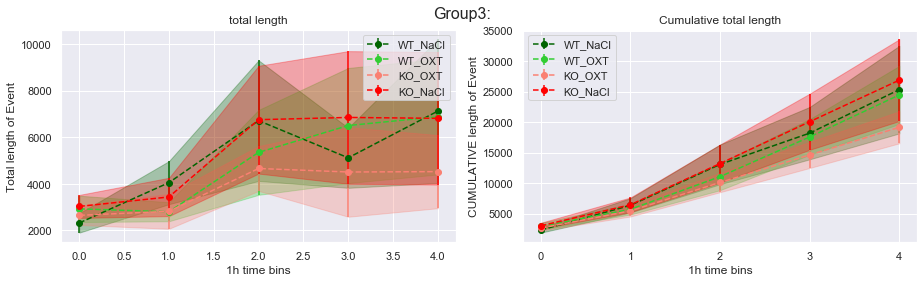

In [132]:
#Plot the data of GROUPED groups using the DOUBLE groupby dataframe:
#dfOne.groupby(['name','GenoA'], as_index=False).get_group(('Move','KO_OXT')).groupby(['bin'], as_index=False)['totalLength'].mean()

groups = ["WT_NaCl", "WT_OXT", "KO_OXT", "KO_NaCl"] #Do not plot Hetero mice

#Define if a behavior is bilateral or unilateral (symetric or not): NOT USED !!!
# beh_bilateral = ["Contact", 'Oral-oral Contact','Side by side Contact','Side by side Contact, opposite way','Group2']
# beh_unilateral = ['Oral-genital Contact','Social approach', 'Social escape', 'Approach contact',
#                   'Approach rear', 'Break contact', 'Get away','FollowZone Isolated', 'Train2']

#Group data by behavior, genotype of animal A and genotype of animal B
dfGrouped = dfThree.groupby(['name','GenoA', 'GenoB', 'GenoC'], as_index=False)

for beh in dfThree['name'].unique():
    ##Fig1 for average of behaviors for the different groups:
    fig1, ax1 = plt.subplots(nrows=1,ncols=2,figsize=(13,4)) #Create a figure with 1 row and 2 columns of subplots
    fig1.suptitle(f"{beh}:" , fontsize=16)
    plt.xticks(np.arange(0,5,step=1)) #x-axis with 0 to 4 bins

    countGraph = 0
    
    for geno1 in groups:
#             print(geno1)
        if "WT" in geno1:
            color = "limegreen" if ("OXT" in geno1) else "darkgreen"
        if "KO" in geno1:
            color = "salmon" if ("OXT" in geno1) else "red"
        if "Hetero" in geno1:
            color = "silver" if ("OXT" in geno1) else "grey"

        #Define the selection Condition over Behavior, Genotype-animalA:
        beh_geno1 = (dfThree['name']==beh) & (dfThree['GenoA']==geno1)
        df_grouped = dfThree.groupby(['name','GenoA'], as_index=False).get_group((beh,geno1)) #Define the Groupby dataframe

        ###Compute the average of the behaviors to plot + SEM
        x = df_grouped.groupby(['bin'], as_index=False)['bin'].mean() #x-axis bins

        df_totalLen_mean = df_grouped.groupby(['bin'])['totalLength'].mean()
        df_totalLen_std = df_grouped.groupby(['bin'])['totalLength'].std()
        df_totalLen_sem = df_totalLen_std / math.sqrt(len(df_totalLen_std))

        ##Plot 'total length'
#         ax1[0].plot(df_totalLen_mean.index, df_totalLen_mean, color=color, marker='o', label=geno1) #plot totalLength
        ax1[0].errorbar(x,df_totalLen_mean,df_totalLen_sem, marker='o', 
                        linestyle='--', color = color, label = geno1) #Plot The Average
        ax1[0].fill_between(x,df_totalLen_mean-df_totalLen_sem, df_totalLen_mean+df_totalLen_sem, color=color, alpha=0.3) #Plot the SEM of the average
        ax1[0].legend()
        ax1[0].set_xlabel('1h time bins')
        ax1[0].set_title("total length")
        ax1[0].set_ylabel('Total length of Event') #Y-axis label on left graph

        ####Compute the CUMULATIVE average of the behaviors to plot + SEM
        df_totalLen_cum = df_grouped.groupby(['bin'])['totalLength_cum'].mean()
        df_totalLen_cum_std = df_grouped.groupby(['bin'])['totalLength_cum'].std()
        df_totalLen_cum_sem = df_totalLen_cum_std / math.sqrt(len(df_totalLen_cum_std))
        
        ##Plot 'CUMULATIVE total length'
#         df_totalLen_cum.plot(x='bin', y='totalLength_cum', color=color, marker='o', label=geno1, ax=ax[1]) #plot Cumulative Length
        ax1[1].errorbar(x,df_totalLen_cum,df_totalLen_cum_sem, marker='o', 
                        linestyle='--', color = color, label = geno1) #Plot The Average
        ax1[1].fill_between(x,df_totalLen_cum-df_totalLen_cum_sem, df_totalLen_cum+df_totalLen_cum_sem, color=color, alpha=0.3) #Plot the SEM of the average
        ax1[1].set_xlabel('1h time bins')
        ax1[1].legend()
        ax1[1].set_title("Cumulative total length")
        ax1[1].set_ylabel('CUMULATIVE length of Event')

        plt.xticks(np.arange(0,5,step=1)) #x-axis with 0 to 4 bins
            
        countGraph +=1
    
    plt.tight_layout() #Display nicely the subgraphs (and fits the png size)
    plt.subplots_adjust(top=0.90) #Adjust where the plots starts (Otherwise overlap with title)

    plt.show() #Display the figure
#     fig1.savefig(f"Hab_1h-bins_{beh}_Beh-2-animals_avg.png", dpi=100) # SAVE A .PNG FIGURE

# 4) Behaviors with Four animals:

## 4.1) Define the dfFour and calculate the cumulative sum of behaviors 

In [34]:
df.name.unique()

array(['Move', 'Move isolated', 'Rearing', 'Rear isolated',
       'Stop isolated', 'WallJump', 'SAP', 'Huddling', 'WaterPoint',
       'Contact', 'Oral-oral Contact', 'Oral-genital Contact',
       'Side by side Contact', 'Side by side Contact, opposite way',
       'Social approach', 'Social escape', 'Approach contact',
       'Approach rear', 'Break contact', 'Get away',
       'FollowZone Isolated', 'Train2', 'Group2', 'Group3', 'Group4',
       'Nest4'], dtype=object)

In [115]:
#Create a dataframe "dfTwo" with the behaviors involving TWO animals!
behaviorsFour = ['Group4', 'Group4 Make', 'Group4 Break', 'Train4', 'Nest4']
dfFour = df[df['name'].isin(behaviorsFour)] #Create the dataframe from the main DF
dfFour

,Date,Cage,Session,bin,start_frame,stop_frame,name,idA,idB,idC,...,GenoB,GenoC,GenoD,totalLength,meanLength,medianLength,numberOfEvents,stdLength,CI95_low,CI95_up
813,190813,Cage1,Hab1,0,2000,110000,Group4,4,2.0,3.0,...,KO_NaCl,KO_OXT,WT_NaCl,0,NaN,NaN,0,NaN,NaN,NaN
814,190813,Cage1,Hab1,0,2000,110000,Group4,4,2.0,1.0,...,KO_NaCl,WT_NaCl,KO_OXT,0,NaN,NaN,0,NaN,NaN,NaN
815,190813,Cage1,Hab1,0,2000,110000,Group4,4,3.0,2.0,...,KO_OXT,KO_NaCl,WT_NaCl,931,13.3,4.0,70,25.256032,7.383401,19.216599
816,190813,Cage1,Hab1,0,2000,110000,Group4,4,3.0,1.0,...,KO_OXT,WT_NaCl,KO_NaCl,0,NaN,NaN,0,NaN,NaN,NaN
817,190813,Cage1,Hab1,0,2000,110000,Group4,4,1.0,2.0,...,WT_NaCl,KO_NaCl,KO_OXT,0,NaN,NaN,0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7480,190911,Cage6,Hab1,4,434000,542000,Nest4,4,1.0,2.0,...,KO_OXT,WT_OXT,KO_OXT,0,NaN,NaN,0,NaN,NaN,NaN
7481,190911,Cage6,Hab1,4,434000,542000,Nest4,4,3.0,1.0,...,KO_OXT,KO_OXT,WT_OXT,0,NaN,NaN,0,NaN,NaN,NaN
7482,190911,Cage6,Hab1,4,434000,542000,Nest4,4,3.0,2.0,...,KO_OXT,WT_OXT,KO_OXT,0,NaN,NaN,0,NaN,NaN,NaN
7483,190911,Cage6,Hab1,4,434000,542000,Nest4,4,2.0,1.0,...,WT_OXT,KO_OXT,KO_OXT,0,NaN,NaN,0,NaN,NaN,NaN


In [123]:
#Adds the Cumulative length of totalLength and meanLength of the 'dfOne' Dataframe 

behaviors = dfFour.name.unique()
rfidAs = dfFour.RFidA.unique()
rfidBs = dfFour.RFidB.unique()
rfidCs = dfFour.RFidC.unique()
rfidDs = dfFour.RFidD.unique()

with tqdm_notebook(total=behaviors.shape[0]*rfidAs.shape[0]*rfidBs.shape[0]*rfidCs.shape[0]*rfidDs.shape[0]) as t:
    for beh in behaviors:
        for rfid1 in rfidAs:
            for rfid2 in rfidBs:
                if rfid1 == rfid2:
                    t.update()
                    continue
                for rfid3 in rfidCs:
                    if rfid3 == rfid2 or rfid3 == rfid1:
                        t.update()
                        continue
                    for rfid4 in rfidDs:
                        if rfid4 == rfid2 or rfid3 == rfid4 or rfid1 == rfid4:
                            t.update()
                            continue
                        cond = (dfFour.name==beh) & (dfFour.RFidA==rfid1) & (dfFour.RFidB==rfid2) & (dfFour.RFidC==rfid3) & (dfFour.RFidD==rfid4)
                        dfFour.loc[cond, "totalLength_cum"] = dfFour.loc[cond, "totalLength"].cumsum()
                        dfFour.loc[cond, "meanLength_cum"] = dfFour.loc[cond, "meanLength"].cumsum()
                        t.update()
                        

KeyboardInterrupt: 

In [124]:
dfFour

,Date,Cage,Session,bin,start_frame,stop_frame,name,idA,idB,idC,...,GenoD,totalLength,meanLength,medianLength,numberOfEvents,stdLength,CI95_low,CI95_up,totalLength_cum,meanLength_cum
813,190813,Cage1,Hab1,0,2000,110000,Group4,4,2.0,3.0,...,WT_NaCl,0,NaN,NaN,0,NaN,NaN,NaN,0.0,NaN
814,190813,Cage1,Hab1,0,2000,110000,Group4,4,2.0,1.0,...,KO_OXT,0,NaN,NaN,0,NaN,NaN,NaN,0.0,NaN
815,190813,Cage1,Hab1,0,2000,110000,Group4,4,3.0,2.0,...,WT_NaCl,931,13.3,4.0,70,25.256032,7.383401,19.216599,931.0,13.3
816,190813,Cage1,Hab1,0,2000,110000,Group4,4,3.0,1.0,...,KO_NaCl,0,NaN,NaN,0,NaN,NaN,NaN,0.0,NaN
817,190813,Cage1,Hab1,0,2000,110000,Group4,4,1.0,2.0,...,KO_OXT,0,NaN,NaN,0,NaN,NaN,NaN,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7480,190911,Cage6,Hab1,4,434000,542000,Nest4,4,1.0,2.0,...,KO_OXT,0,NaN,NaN,0,NaN,NaN,NaN,0.0,NaN
7481,190911,Cage6,Hab1,4,434000,542000,Nest4,4,3.0,1.0,...,WT_OXT,0,NaN,NaN,0,NaN,NaN,NaN,0.0,NaN
7482,190911,Cage6,Hab1,4,434000,542000,Nest4,4,3.0,2.0,...,KO_OXT,0,NaN,NaN,0,NaN,NaN,NaN,0.0,NaN
7483,190911,Cage6,Hab1,4,434000,542000,Nest4,4,2.0,1.0,...,KO_OXT,0,NaN,NaN,0,NaN,NaN,NaN,0.0,NaN


# ADDITIONAL STUFF:

C:\Users\Damien\Anaconda3\lib\site-packages\ipykernel_launcher.py:24: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
C:\Users\Damien\Anaconda3\lib\site-packages\ipykernel_launcher.py:26: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


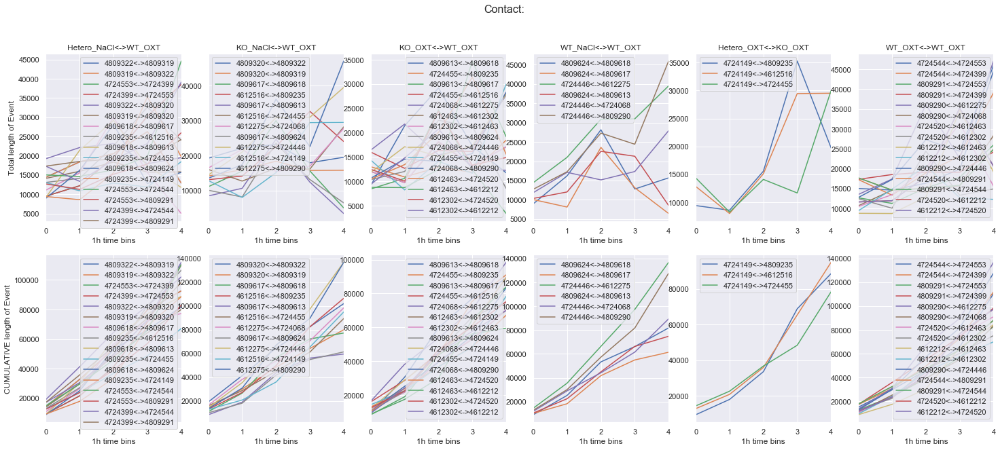

KeyboardInterrupt: 

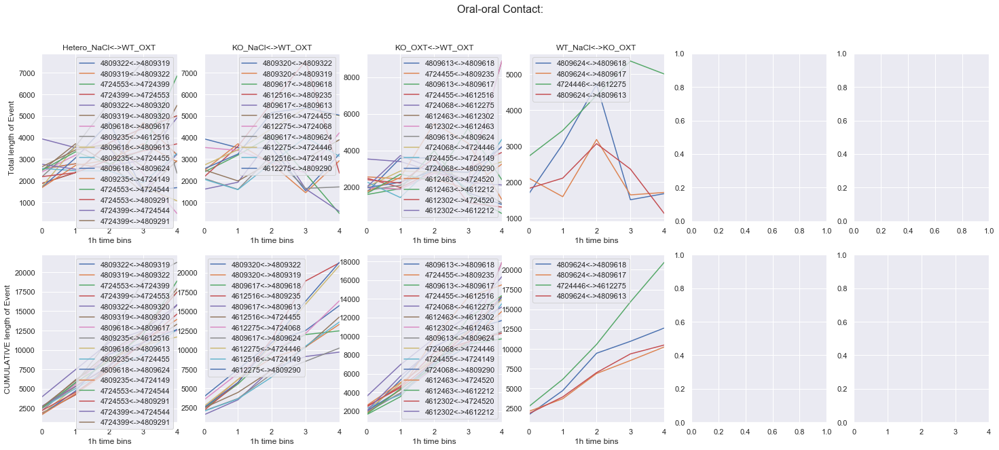

In [95]:
#Plot the data of the different behaviors, Grouped by genotype<-> interactions:
for beh in dfTwo['name'].unique():
#     print(beh)
    fig, ax = plt.subplots(nrows=2,ncols=6,figsize=(25,10)) #Create a figure with 2 rows and 6 columns of subplots
    fig.suptitle(f"{beh}:" , fontsize=16)
    
    count = 0

    for geno1 in dfTwo['GenoA'].unique():
#         print(f" **** {geno1} ****")
#         print(dfTwo[(dfTwo['name']==beh) & (dfTwo['GenoA']==geno1)]['RFidA'].unique())
        for geno2 in dfTwo['GenoB'].unique():
#             print(f" ** {geno2} **")
            
            #Define the 'selection' of Behavior, Genotype-animalA and Genotype-animalB:
            selection = (dfTwo['name']==beh) & (dfTwo['GenoA']==geno1) & (dfTwo['GenoB']==geno2) 

            #Define the Groupby dataframe:
            if len(dfTwo[(dfTwo['name']==beh) & (dfTwo['GenoA']==geno1) & (dfTwo['GenoB']==geno2)]) == 0: # Test if NO Geno1-Geno2 match
#                         print(f"No match between {geno1} and {geno2}")
                        continue  
            df_temp = dfTwo.groupby(['name','GenoA', 'GenoB']).get_group((beh,geno1, geno2)) 

            for rf1 in df_temp[selection]['RFidA'].unique():
#                 print(f"rf1:{rf1}")
                for rf2 in df_temp[selection]['RFidB'].unique():
                    rf2 = int(rf2)
                    if rf1 == rf2:
#                         print("Same ID ... Continue")
                        continue
#                     print(f"rf2:{rf2}")

                    if len(df_temp[(df_temp['RFidA']==rf1) & (df_temp['RFidB']==rf2)]) == 0:#NO RF1-RF2 match
#                         print(f"No match between {rf1} and {rf2}")
                        continue          
                        
                    df_temp[(df_temp['RFidA']==rf1) & (df_temp['RFidB']==rf2)].plot(x='bin', y='totalLength', label=f"{rf1}<->{rf2}", ax=ax[0,count])
                    df_temp[(df_temp['RFidA']==rf1) & (df_temp['RFidB']==rf2)].plot(x='bin', y='totalLength_cum', label=f"{rf1}<->{rf2}", ax=ax[1,count])
                    ax[0,count].set_xlabel('1h time bins')
                    ax[0,count].set_title(f"{geno1}<->{geno2}")
                    ax[1,count].set_xlabel('1h time bins')
#                     print("plotted")

            plt.xticks(np.arange(0,5,step=1)) #x-axis with 0 to 4 bins
            ax[0,0].set_ylabel('Total length of Event') #Y-axis label on left graph
            ax[1,0].set_ylabel('CUMULATIVE length of Event')

        count += 1
        
    plt.show() #Display the figures
    fig.savefig(f"Hab_1h-bins_{beh}_genoA-genoB.png", dpi=100) # SAVE A .PNG FIGURE

In [165]:
df_tempo = dfTwo.groupby(['name','GenoA', 'GenoB'], as_index=False)
df_tempo.get_group(("Contact","KO_OXT", "WT_OXT")).groupby('bin')['totalLength'].std()

bin
0     1418.517818
1     2769.908699
2     4955.800672
3    10632.018797
4     6256.805591
Name: totalLength, dtype: float64

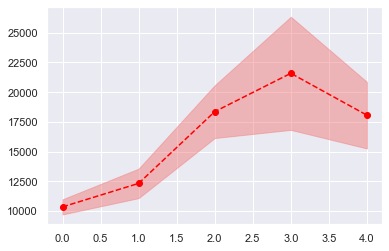

In [209]:
df_tempo = dfTwo.groupby(['name','GenoA', 'GenoB'], as_index=False)

bins = df_tempo.get_group(("Contact","KO_OXT", "WT_OXT")).groupby('bin')['bin'].mean()
totalLength = df_tempo.get_group(("Contact","KO_OXT", "WT_OXT")).groupby('bin')['totalLength'].mean() #Y is mean
std = df_tempo.get_group(("Contact","KO_OXT", "WT_OXT")).groupby('bin')['totalLength'].std() # Error is std
SEM = std/math.sqrt(len(std))

plt.errorbar(bins, totalLength, linestyle='--', marker='o', color = 'red')
plt.fill_between(bins, totalLength-SEM, totalLength+SEM, color='lightcoral', alpha=0.5)

plt.show()

In [193]:
SEM

bin
0     634.380454
1    1238.740828
2    2216.301437
3    4754.783354
4    2798.128525
Name: totalLength, dtype: float64

## DO FOR DIFFERENT CAGES: ##

Contact
there are 6 cages
 **** Hetero_NaCl ****
[4809322 4809319 4809618 4809235 4724553 4724399]
rf1:4809322
[4809322 4809319 4809320]
Same ID ... Continue
rf2-2:4809319
rf2-2:4809320
rf1:4809319
[4809322 4809319 4809320]
rf2-2:4809322
Same ID ... Continue
rf2-2:4809320
rf1:4809618
[4809618 4809617 4809613 4809624]
Same ID ... Continue
rf2-2:4809617
rf2-2:4809613
rf2-2:4809624
rf1:4809235
[4809235 4724149 4612516 4724455]
Same ID ... Continue
rf2-2:4724149
rf2-2:4612516
rf2-2:4724455
rf1:4724553
[4724553 4724399 4724544 4809291]
Same ID ... Continue
rf2-2:4724399
rf2-2:4724544
rf2-2:4809291
rf1:4724399
[4724553 4724399 4724544 4809291]
rf2-2:4724553
Same ID ... Continue
rf2-2:4724544
rf2-2:4809291
 **** KO_NaCl ****
[4809320 4809617 4612516 4612275]
rf1:4809320
[4809322 4809319 4809320]
rf2-2:4809322
rf2-2:4809319
Same ID ... Continue
rf1:4809617
[4809618 4809617 4809613 4809624]
rf2-2:4809618
Same ID ... Continue
rf2-2:4809613
rf2-2:4809624
rf1:4612516
[4809235 4724149 4612516 47244

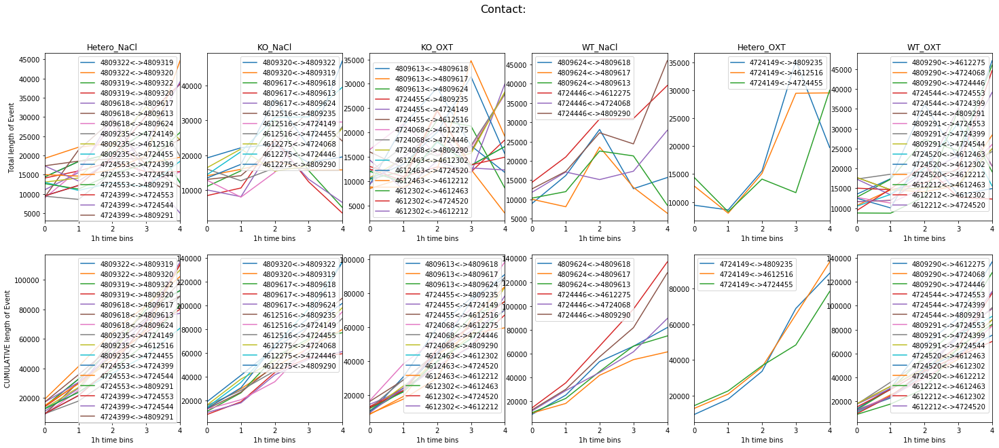

Oral-oral Contact
there are 6 cages
 **** Hetero_NaCl ****
[4809322 4809319 4809618 4809235 4724553 4724399]
rf1:4809322
[4809322 4809319 4809320]
Same ID ... Continue
rf2-2:4809319
rf2-2:4809320
rf1:4809319
[4809322 4809319 4809320]
rf2-2:4809322
Same ID ... Continue
rf2-2:4809320
rf1:4809618
[4809618 4809617 4809613 4809624]
Same ID ... Continue
rf2-2:4809617
rf2-2:4809613
rf2-2:4809624
rf1:4809235
[4809235 4724149 4612516 4724455]
Same ID ... Continue
rf2-2:4724149
rf2-2:4612516
rf2-2:4724455
rf1:4724553
[4724553 4724399 4724544 4809291]
Same ID ... Continue
rf2-2:4724399
rf2-2:4724544
rf2-2:4809291
rf1:4724399
[4724553 4724399 4724544 4809291]
rf2-2:4724553
Same ID ... Continue
rf2-2:4724544
rf2-2:4809291
 **** KO_NaCl ****
[4809320 4809617 4612516 4612275]
rf1:4809320
[4809322 4809319 4809320]
rf2-2:4809322
rf2-2:4809319
Same ID ... Continue
rf1:4809617
[4809618 4809617 4809613 4809624]
rf2-2:4809618
Same ID ... Continue
rf2-2:4809613
rf2-2:4809624
rf1:4612516
[4809235 4724149 461

KeyboardInterrupt: 

In [120]:
#Plot the data OF INDIVIDUALS MICE for the Different CAGES

for beh in dfTwo['name'].unique():
    print(beh)
    fig, ax = plt.subplots(nrows=2,ncols=6,figsize=(25,10)) #Create a figure with 2 rows and 6 columns of subplots
    fig.suptitle(f"{beh}:" , fontsize=16)
    
    count = 0
    
    nb_cages = len(dfTwo['Cage'].unique())
    print(f"there are {nb_cages} cages: {dfTwo['Cage'].unique()}")
    for cage in dfTwo['Cage'].unique(): #One graph of individual traces per cage
#         for geno in dfTwo[(dfTwo['Cage']==cage)]['GenoA'].unique(): #O
            print(f" **** {geno} ****")
    #         rfs = [] #List to follow which rfid is already done
            print(dfTwo[(dfTwo['name']==beh) & (dfTwo['GenoA']==geno)]['RFidA'].unique())
            for rf1 in dfTwo[(dfTwo['name']==beh) & (dfTwo['GenoA']==geno)]['RFidA'].unique():
                print(f"rf1:{rf1}")
                print(dfTwo[(dfTwo['Cage']==dfTwo[(dfTwo['RFidA']==rf1)]['Cage'].unique()[0])]['RFidA'].unique())
                for rf2 in dfTwo[(dfTwo['Cage']==dfTwo[(dfTwo['RFidA']==rf1)]['Cage'].unique()[0])]['RFidA'].unique():
    #                 print(f"rf2-1:{rf2}")
                    if rf1 == rf2:
                        print("Same ID ... Continue")
                        continue
                    print(f"rf2-2:{rf2}")

                    df_temp = dfTwo.groupby(['name','GenoA']).get_group((beh,geno)) #Define the Groupby dataframe

                    df_temp[(df_temp['RFidA']==rf1) & (df_temp['RFidB']==rf2)].plot(x='bin', y='totalLength', label=f"{rf1}<->{rf2}", ax=ax[0,count])
                    df_temp[(df_temp['RFidA']==rf1) & (df_temp['RFidB']==rf2)].plot(x='bin', y='totalLength_cum', label=f"{rf1}<->{rf2}", ax=ax[1,count])
                    ax[0,count].set_xlabel('1h time bins')
                    ax[0,count].set_title(geno)
                    ax[1,count].set_xlabel('1h time bins')

            plt.xticks(np.arange(0,5,step=1)) #x-axis with 0 to 4 bins
            ax[0,0].set_ylabel('Total length of Event') #Y-axis label on left graph
            ax[1,0].set_ylabel('CUMULATIVE length of Event')

            count += 1
        
    plt.show() #Display the figures
#     fig.savefig(f"Hab_1h-bins_{beh}_individuals.png", dpi=100) # SAVE A .PNG FIGURE

In [ ]:
#Create a dataframe "dfTwo" with the behaviors involving TWO animals!
behaviorsThree = ['Group3', 'Nest3'] #SOME MISSING HERE ??!
dfThree = df[df['name'].isin(behaviorsOne)] #Create the dataframe from the main DF
dfThree = dfThree.drop(columns=["idC", "idD","GenoC","GenoD",'RFidC','RFidD']) #Removes useless columns
dfThree

In [ ]:
#Create a dataframe "dfTwo" with the behaviors involving TWO animals!
behaviorsFour = ['Group4', 'Nest4'] #SOME MISSING HERE ??!
dfFour = df[df['name'].isin(behaviorsOne)] #Create the dataframe from the main DF
dfFour = dfThree.drop(columns=["idC", "idD","GenoC","GenoD",'RFidC','RFidD']) #Removes useless columns
dfFour

In [336]:
#TEST USE THE FOR LOOP WITHIN THE GROUPBY PARAM!!

# df_temp = dfOne.groupby(['name','GenoA']).get_group((beh,geno)) #Define the Groupby dataframe

# for (beh, geno), group in df_temp:
#     print(name)
#     pr
#     fig, ax = plt.subplots(nrows=2,ncols=6,figsize=(25,10)) #Create a figure with 2 rows and 6 columns of subplots
#     fig.suptitle(f"{beh}:" , fontsize=16)
    
#     count = 0
#     for geno in dfOne['GenoA'].unique():
# #         print(geno)
#         for rf in dfOne[(dfOne['name']==beh) & (dfOne['GenoA']==geno)]['RFidA'].unique():
            
#             df_temp[df_temp['RFidA']==rf].plot(x='bin', y='totalLength', label=rf, ax=ax[0,count])
#             df_temp[df_temp['RFidA']==rf].plot(x='bin', y='totalLength_cum', label=rf, ax=ax[1,count])
#             ax[0,count].set_xlabel('1h time bins')
#             ax[0,count].set_title(geno)
#             ax[1,count].set_xlabel('1h time bins')
#         plt.xticks(np.arange(0,5,step=1)) #x-axis with 0 to 4 bins
#         ax[0,0].set_ylabel('Total length of Event') #Y-axis label on left graph
#         ax[1,0].set_ylabel('CUMULATIVE length of Event')
        
#         count += 1
        
#     plt.show() #Dsiplay the figure
#     fig.savefig(f"Hab_1h-bins_{beh}_individuals.png", dpi=100) # SAVE A .PNG FIGURE



In [330]:
for (i,j),k in dfOne.groupby(['name','GenoA']):
    print(i)
    print(j)

Huddling
Hetero_NaCl
Huddling
Hetero_OXT
Huddling
KO_NaCl
Huddling
KO_OXT
Huddling
WT_NaCl
Huddling
WT_OXT
Move
Hetero_NaCl
Move
Hetero_OXT
Move
KO_NaCl
Move
KO_OXT
Move
WT_NaCl
Move
WT_OXT
Move isolated
Hetero_NaCl
Move isolated
Hetero_OXT
Move isolated
KO_NaCl
Move isolated
KO_OXT
Move isolated
WT_NaCl
Move isolated
WT_OXT
Rear isolated
Hetero_NaCl
Rear isolated
Hetero_OXT
Rear isolated
KO_NaCl
Rear isolated
KO_OXT
Rear isolated
WT_NaCl
Rear isolated
WT_OXT
Rearing
Hetero_NaCl
Rearing
Hetero_OXT
Rearing
KO_NaCl
Rearing
KO_OXT
Rearing
WT_NaCl
Rearing
WT_OXT
SAP
Hetero_NaCl
SAP
Hetero_OXT
SAP
KO_NaCl
SAP
KO_OXT
SAP
WT_NaCl
SAP
WT_OXT
Stop isolated
Hetero_NaCl
Stop isolated
Hetero_OXT
Stop isolated
KO_NaCl
Stop isolated
KO_OXT
Stop isolated
WT_NaCl
Stop isolated
WT_OXT
WallJump
Hetero_NaCl
WallJump
Hetero_OXT
WallJump
KO_NaCl
WallJump
KO_OXT
WallJump
WT_NaCl
WallJump
WT_OXT
WaterPoint
Hetero_NaCl
WaterPoint
Hetero_OXT
WaterPoint
KO_NaCl
WaterPoint
KO_OXT
WaterPoint
WT_NaCl
WaterPoint
WT

In [232]:
result = df.sort_values(['RFidA','name','GenoA','bin'])
result[['name', 'GenoA','bin', 'RFidA', 'RFidB','totalLength', 'totalLength_cum']]

,name,GenoA,bin,RFidA,RFidB,totalLength,totalLength_cum
39639,Approach contact,WT_OXT,0,4612212,4612463.0,554,554.0
39640,Approach contact,WT_OXT,0,4612212,4612302.0,527,1081.0
39641,Approach contact,WT_OXT,0,4612212,4724520.0,586,1667.0
39939,Approach contact,WT_OXT,1,4612212,4612463.0,546,2213.0
39940,Approach contact,WT_OXT,1,4612212,4612302.0,456,2669.0
...,...,...,...,...,...,...,...
11045,WaterPoint,WT_NaCl,25,4809624,4809613.0,0,0.0
11345,WaterPoint,WT_NaCl,26,4809624,4809613.0,0,0.0
11645,WaterPoint,WT_NaCl,27,4809624,4809613.0,0,0.0
11945,WaterPoint,WT_NaCl,28,4809624,4809613.0,0,0.0


In [220]:
#Creates a Dataframe with the Mean of each parameter for the different groups
df_genotypes = df.groupby(['name','GenoA','bin'], axis=0)["totalLength", "meanLength", "medianLength","numberOfEvents"].mean().reset_index()
df_genotypes

,name,GenoA,bin,totalLength,meanLength,medianLength,numberOfEvents
0,Approach contact,Hetero_NaCl,0,770.5000,4.350189,2.37500,180.7500
1,Approach contact,Hetero_NaCl,1,863.7500,4.558097,2.43750,193.8750
2,Approach contact,Hetero_NaCl,2,992.1250,4.114422,2.18750,247.0000
3,Approach contact,Hetero_NaCl,3,741.8125,4.401577,2.34375,176.8125
4,Approach contact,Hetero_NaCl,4,726.0000,4.449439,2.12500,170.6250
...,...,...,...,...,...,...,...
4855,WaterPoint,WT_OXT,25,0.0000,NaN,NaN,0.0000
4856,WaterPoint,WT_OXT,26,0.0000,NaN,NaN,0.0000
4857,WaterPoint,WT_OXT,27,0.0000,NaN,NaN,0.0000
4858,WaterPoint,WT_OXT,28,0.0000,NaN,NaN,0.0000


In [189]:
df_genotypes["totalLength_cum"] = df_genotypes[(df_genotypes['GenoA'] == 'WT_OXT')]["totalLength"].cumsum()
df_genotypes[0:10]

,GenoA,bin,totalLength,meanLength,medianLength,numberOfEvents,totalLength_cum
0,Hetero_NaCl,0,847.039683,8.230984,3.526408,119.304233,NaN
1,Hetero_NaCl,1,838.896825,8.128481,3.526316,122.177249,NaN
2,Hetero_NaCl,2,883.767196,9.069534,3.478947,133.370370,NaN
3,Hetero_NaCl,3,762.052910,8.579657,3.705674,109.772487,NaN
4,Hetero_NaCl,4,749.441799,8.284390,3.456140,104.867725,NaN
5,Hetero_NaCl,5,721.021164,8.770533,3.524823,97.415344,NaN
6,Hetero_NaCl,6,787.113757,9.189799,3.455830,110.216931,NaN
7,Hetero_NaCl,7,721.243386,10.292475,3.794224,91.206349,NaN
8,Hetero_NaCl,8,796.854497,8.624752,3.740351,112.500000,NaN
9,Hetero_NaCl,9,753.603175,9.106475,3.012500,104.939153,NaN


In [192]:
df_genotypes.loc[df_genotypes.GenoA=='WT_OXT', "totalLength_cum"] = df_genotypes.loc[df_genotypes.GenoA=='WT_OXT', "totalLength"].cumsum()
df_genotypes.loc[df_genotypes.GenoA=='WT_NaCl', "totalLength_cum"] = df_genotypes.loc[df_genotypes.GenoA=='WT_NaCl', "totalLength"].cumsum()
df_genotypes.loc[df_genotypes.GenoA=='KO_OXT', "totalLength_cum"] = df_genotypes.loc[df_genotypes.GenoA=='KO_OXT', "totalLength"].cumsum()
df_genotypes.loc[df_genotypes.GenoA=='KO_NaCl', "totalLength_cum"] = df_genotypes.loc[df_genotypes.GenoA=='KO_NaCl', "totalLength"].cumsum()
df_genotypes

,GenoA,bin,totalLength,meanLength,medianLength,numberOfEvents,totalLength_cum
0,Hetero_NaCl,0,847.039683,8.230984,3.526408,119.304233,NaN
1,Hetero_NaCl,1,838.896825,8.128481,3.526316,122.177249,NaN
2,Hetero_NaCl,2,883.767196,9.069534,3.478947,133.370370,NaN
3,Hetero_NaCl,3,762.052910,8.579657,3.705674,109.772487,NaN
4,Hetero_NaCl,4,749.441799,8.284390,3.456140,104.867725,NaN
...,...,...,...,...,...,...,...
175,WT_OXT,25,786.754667,188.904958,173.969484,151.394667,18987.101333
176,WT_OXT,26,693.869333,22.608309,3.025478,118.632000,19680.970667
177,WT_OXT,27,475.021333,15.445399,3.087302,76.821333,20155.992000
178,WT_OXT,28,878.101333,74.072490,57.292490,134.376000,21034.093333


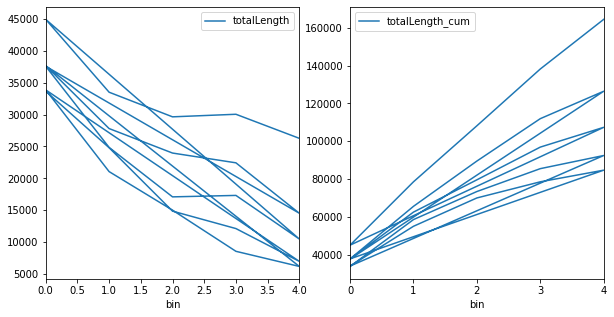

In [23]:
fig, ax = plt.subplots(1,2,figsize=(10, 5)) #Subplot
plt.xticks(np.arange(0, 5, step=1)) 

result[(result['GenoA'] == 'WT_OXT')&(result['name'] == 'Move')].plot(x="bin",y="totalLength", ax=ax[0])
result[(result['GenoA'] == 'WT_OXT')&(result['name'] == 'Move')].plot(x="bin",y="totalLength_cum", ax=ax[1])

In [196]:
#Display the different behaviors in the dataframe
df.name.unique()

AttributeError: 'DataFrame' object has no attribute 'name'

In [ ]:
for beh in dfOne.name.unique():
    fig, ([ax11,ax12],[ax21,ax22], [ax31, ax32], [ax41, ax42], [ax51,ax52]) = plt.subplots(5,2,figsize=(15, 30)) #Subplot (2 lines, 2 columns)
#     ax = plt.gca() # get current axis

# # ##  ###   #####     ########        ###########           #####################     
    # SET UP THE LEFT GRAPH (ax11) with TotalLength
    ax11.set_title(f'Habituation - {beh} - TotalLength')
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="KO_NaCl")].plot(x='bin',y='totalLength',label="KO-NaCl",color='red',ax=ax11)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="KO_OXT")].plot(x='bin',y='totalLength',label="KO-OXT",color='orange',ax=ax11)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="WT_NaCl")].plot(x='bin',y='totalLength',label="WT-NaCl",color='blue',ax=ax11)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="WT_OXT")].plot(x='bin',y='totalLength',label="WT-OXT",color='green',ax=ax11)
    ax11.set_xlabel("Timebins of 1 hour") #Set x-axis of ax11 subplot
    ax11.set_ylabel("Total Length of Events") #Set y-axis of ax11 subplot

    
    # SET UP THE RIGHT GRAPH (ax12) with CUMULATIVE TotalLength
    ax12.set_title(f'Habituation - {beh} - Cumulative TotalLength')
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="KO_NaCl")]["totalLength_cum"].plot(x='bin',label="KO-NaCl",color='red',ax=ax12)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="KO_OXT")]["totalLength_cum"].plot(x='bin',label="KO-OXT",color='orange',ax=ax12)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="WT_NaCl")]["totalLength_cum"].plot(x='bin',label="WT-NaCl",color='blue',ax=ax12)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="WT_OXT")]["totalLength_cum"].plot(x='bin',label="WT-OXT",color='green',ax=ax12)
    ax12.set_xlabel("Timebins of 1 hour") #Set x-axis of ax12 subplot
    ax12.set_ylabel("Cumulative Duration of Events") #Set y-axis of ax12 subplot

# # ##  ###   #####     ########        ###########           #####################     
    # SET UP THE LEFT GRAPH (ax21) with NumberOfEvents
    ax21.set_title(f'Habituation - {beh} - NumberOfEvents')
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="KO_NaCl")].plot(x='bin',y='numberOfEvents',label="KO-NaCl",color='red',ax=ax21)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="KO_OXT")].plot(x='bin',y='numberOfEvents',label="KO-OXT",color='orange',ax=ax21)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="WT_NaCl")].plot(x='bin',y='numberOfEvents',label="WT-NaCl",color='blue',ax=ax21)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="WT_OXT")].plot(x='bin',y='numberOfEvents',label="WT-OXT",color='green',ax=ax21)
    ax21.set_xlabel("Timebins of 1 hour") #Set x-axis of ax21 subplot
    ax21.set_ylabel("Number of Events") #Set y-axis of ax21 subplot

    # SET UP THE RIGHT GRAPH (ax22) with CUMULATIVE NumberOfEvents
    ax22.set_title(f'Habituation - {beh} - Cumulative NumberOfEvents')
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="KO_NaCl")]["numberOfEvents"].cumsum().plot(x='bin',y='numberOfEvents',label="KO-NaCl",color='red',ax=ax22)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="KO_OXT")]["numberOfEvents"].cumsum().plot(x='bin',y='numberOfEvents',label="KO-OXT",color='orange',ax=ax22)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="WT_NaCl")]["numberOfEvents"].cumsum().plot(x='bin',y='numberOfEvents',label="WT-NaCl",color='blue',ax=ax22)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="WT_OXT")]["numberOfEvents"].cumsum().plot(x='bin',y='numberOfEvents',label="WT-OXT",color='green',ax=ax2)
    ax22.set_xlabel("Timebins of 1 hour") #Set x-axis of ax22 subplot
    ax22.set_ylabel("Cumulative Number of Events") #Set y-axis of ax22 subplot

# # ##  ###   #####     ########        ###########           #####################     
        # SET UP THE LEFT GRAPH (ax31) with meanLength
    ax31.set_title(f'Habituation - {beh} - meanLength')
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="KO_NaCl")].plot(x='bin',y='meanLength',label="KO-NaCl",color='red',ax=ax31)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="KO_OXT")].plot(x='bin',y='meanLength',label="KO-OXT",color='orange',ax=ax31)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="WT_NaCl")].plot(x='bin',y='meanLength',label="WT-NaCl",color='blue',ax=ax31)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="WT_OXT")].plot(x='bin',y='meanLength',label="WT-OXT",color='green',ax=ax31)
    ax31.set_xlabel("Timebins of 10 minutes") #Set x-axis of ax31 subplot
    ax31.set_ylabel("Mean Length of Events") #Set y-axis of ax31 subplot

    
    # SET UP THE TOP-RIGHT GRAPH (ax32) with CUMULATIVE meanLength
    ax32.set_title(f'Habituation - {beh} - Cumulative meanLength')
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="KO_NaCl")]["meanLength"].cumsum().plot(x='bin',y='meanLength',label="KO-NaCl",color='red',ax=ax32)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="KO_OXT")]["meanLength"].cumsum().plot(x='bin',y='meanLength',label="KO-OXT",color='orange',ax=ax32)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="WT_NaCl")]["meanLength"].cumsum().plot(x='bin',y='meanLength',label="WT-NaCl",color='blue',ax=ax32)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="WT_OXT")]["meanLength"].cumsum().plot(x='bin',y='meanLength',label="WT-OXT",color='green',ax=ax32)
    ax32.set_xlabel("Timebins of 10 minutes") #Set x-axis of ax32 subplot
    ax32.set_ylabel("Cumulative meanLength of Events") #Set y-axis of ax32 subplot

# # ##  ###   #####     ########        ###########           #####################     
    # SET UP THE TOP-LEFT GRAPH (ax41) with medianLength
    ax41.set_title(f'Habituation - {beh} - medianLength')
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="KO_NaCl")].plot(x='bin',y='medianLength',label="KO-NaCl",color='red',ax=ax41)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="KO_OXT")].plot(x='bin',y='medianLength',label="KO-OXT",color='orange',ax=ax41)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="WT_NaCl")].plot(x='bin',y='medianLength',label="WT-NaCl",color='blue',ax=ax41)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="WT_OXT")].plot(x='bin',y='medianLength',label="WT-OXT",color='green',ax=ax41)
    ax41.set_xlabel("Timebins of 10 minutes") #Set x-axis of ax41 subplot
    ax41.set_ylabel("Median Length of Events") #Set y-axis of ax41 subplot

    # SET UP THE TOP-RIGHT GRAPH (ax42) with CUMULATIVE medianLength
    ax42.set_title(f'Habituation - {beh} - Cumulative medianLength')
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="KO_NaCl")]["medianLength"].cumsum().plot(x='bin',y='medianLength',label="KO-NaCl",color='red',ax=ax42)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="KO_OXT")]["medianLength"].cumsum().plot(x='bin',y='medianLength',label="KO-OXT",color='orange',ax=ax42)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="WT_NaCl")]["medianLength"].cumsum().plot(x='bin',y='medianLength',label="WT-NaCl",color='blue',ax=ax42)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="WT_OXT")]["medianLength"].cumsum().plot(x='bin',y='medianLength',label="WT-OXT",color='green',ax=ax42)
    ax42.set_xlabel("Timebins of 10 minutes") #Set x-axis of ax42 subplot
    ax42.set_ylabel("Cumulative medianLength of Events") #Set y-axis of ax42 subplot

# # ##  ###   #####     ########        ###########           #####################     
    # SET UP THE TOP-LEFT GRAPH (ax51) with Standard Deviation
    ax51.set_title(f'Habituation - {beh} - stdLength')
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="KO_NaCl")].plot(x='bin',y='stdLength',label="KO-NaCl",color='red',ax=ax51)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="KO_OXT")].plot(x='bin',y='stdLength',label="KO-OXT",color='orange',ax=ax51)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="WT_NaCl")].plot(x='bin',y='stdLength',label="WT-NaCl",color='blue',ax=ax51)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="WT_OXT")].plot(x='bin',y='stdLength',label="WT-OXT",color='green',ax=ax51)
    ax51.set_xlabel("Timebins of 10 minutes") #Set x-axis of ax51 subplot
    ax51.set_ylabel("Standard deviation of Events") #Set y-axis of ax51 subplot

    # SET UP THE TOP-RIGHT GRAPH (ax52) with CUMULATIVE stdLength
    ax52.set_title(f'Habituation - {beh} - Cumulative stdLength')
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="KO_NaCl")]["stdLength"].cumsum().plot(x='bin',y='stdLength',label="KO-NaCl",color='red',ax=ax52)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="KO_OXT")]["stdLength"].cumsum().plot(x='bin',y='stdLength',label="KO-OXT",color='orange',ax=ax52)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="WT_NaCl")]["stdLength"].cumsum().plot(x='bin',y='stdLength',label="WT-NaCl",color='blue',ax=ax52)
    dfOne[(dfOne['name']==beh)&(dfOne['GenoA']=="WT_OXT")]["stdLength"].cumsum().plot(x='bin',y='stdLength',label="WT-OXT",color='green',ax=ax52)
    ax52.set_xlabel("Timebins of 10 minutes") #Set x-axis of ax52 subplot
    ax52.set_ylabel("Cumulative Standard deviation of Events") #Set y-axis of ax52 subplot


    plt.show()